In [ ]:
pwd!

'/Users/emmaebenezer/info442'

In [ ]:
ls

INFO442Data/              Null_Preprocessing.ipynb


In [ ]:
import os
os.getcwd()

'/content'

In [ ]:
os.path.exists('/Users/emmaebenezer/Downloads/INFO442Data/train_transaction.csv')

False

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np,gc # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
pd.set_option('display.max_columns', 500)

cols_t = ['TransactionID', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9']
cols_v = ['V'+str(x) for x in range(1,340)]; types_v = {}
for c in cols_v: types_v[c] = 'float32'

# emma csv upload path
# train = pd.read_csv(
#     'INFO442Data/train_transaction.csv',
#     usecols=cols_t + ['isFraud'] + cols_v,
#     dtype=types_v
# )

# katie csv upload path
train = pd.read_csv(
    'train_transaction.csv',
    usecols=cols_t + ['isFraud'] + cols_v,
    dtype=types_v
)

In [2]:
print(train.head())

   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987000        0          86400            68.5         W  13926   
1        2987001        0          86401            29.0         W   2755   
2        2987002        0          86469            59.0         W   4663   
3        2987003        0          86499            50.0         W  18132   
4        2987004        0          86506            50.0         H   4497   

   card2  card3       card4  card5   card6  addr1  addr2  dist1  dist2  \
0    NaN  150.0    discover  142.0  credit  315.0   87.0   19.0    NaN   
1  404.0  150.0  mastercard  102.0  credit  325.0   87.0    NaN    NaN   
2  490.0  150.0        visa  166.0   debit  330.0   87.0  287.0    NaN   
3  567.0  150.0  mastercard  117.0   debit  476.0   87.0    NaN    NaN   
4  514.0  150.0  mastercard  102.0  credit  420.0   87.0    NaN    NaN   

  P_emaildomain R_emaildomain   C1   C2   C3   C4   C5   C6   C7   C8   C9  \
0           Na

In [3]:
# Compute boolean mask of missing values for entire training set
nans_df = train.isna()
nans_groups={}
i_cols = ['V'+str(i) for i in range(1,340)]

# Group columns by how many NaNs they have
for col in train.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]
del nans_df; x=gc.collect()

# Print each NaN-count group and its columns
for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 0
['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
####### NAN count = 8933
['card2']
####### NAN count = 1565
['card3']
####### NAN count = 1577
['card4']
####### NAN count = 4259
['card5']
####### NAN count = 1571
['card6']
####### NAN count = 65706
['addr1', 'addr2']
####### NAN count = 352271
['dist1']
####### NAN count = 552913
['dist2']
####### NAN count = 94456
['P_emaildomain']
####### NAN count = 453249
['R_emaildomain']
####### NAN count = 1269
['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
####### NAN count = 280797
['D2']
####### NAN count = 262878
['D3']
####### NAN count = 168922
['D4']
####### NAN count = 309841
['D5']
####### NAN count = 517353
['D6']
####### NAN count = 551623
['D7']
####### NAN count = 515614
['D8', 'D9']
####### NAN count = 76022
['D10']
####### NAN count = 27

# V1-V11

A short pipeline is used with the functions defined in this section. It is run on all of the V-columns in groups denoted by the header. It follows this order:


1.   NaN grouping: bucket all columns by NaN count, so columns that are missing together end up in the same group
2.   make_plots(Vs): histogram each column in a group, labeling whether it's int/float-like, its cardinality, and pct. missing.
3.   make_corr(Vs, Vtitle): heatmap the correlation between columns in a group (plus TransactionDT) to spot near-duplicate/redundant features.
4.   reduce_group(grps): Given manually-defined subgroups of correlated columns (from step 3), pick one representative column per sub-group (the one with the most unique values) to keep so the rest can be dropped.

Comments are added in this section; the same code is repeated in all other sections.



In [ ]:
# base cols for comparison
Vc = ['dayr','isFraud','TransactionAmt','card1','addr1']
Vs = nans_groups[279287]
Vtitle = 'V1 - V11'

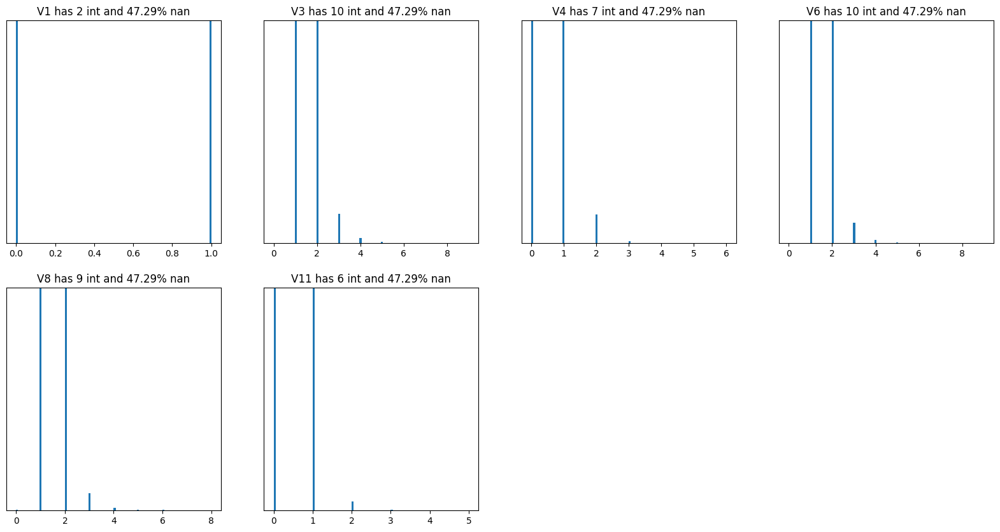

In [20]:
def make_plots(Vs):
    col = 4

    # number of suplot rows needed
    row = len(Vs)//4+1
    plt.figure(figsize=(20,row*5))

    # rows where first column is not NaN
    idx = train[~train[Vs[0]].isna()].index
    for i,v in enumerate(Vs):
        plt.subplot(row,col,i+1)
        n = train[v].nunique() # num. of unique values
        x = np.sum(train.loc[idx,v]!=train.loc[idx,v].astype(int)) # count non-integer values
        y = np.round(100*np.sum(train[v].isna())/len(train),2) # percent NaN
        t = 'int'
        if x!=0: t = 'float' # mark as float if any non-int values found
        plt.title(v+' has '+str(n)+' '+t+' and '+str(y)+'% nan')
        plt.yticks([])
        h = plt.hist(train.loc[idx,v],bins=100)
        if len(h[0])>1: plt.ylim((0,np.sort(h[0])[-2]))
    plt.show()
make_plots(Vs)

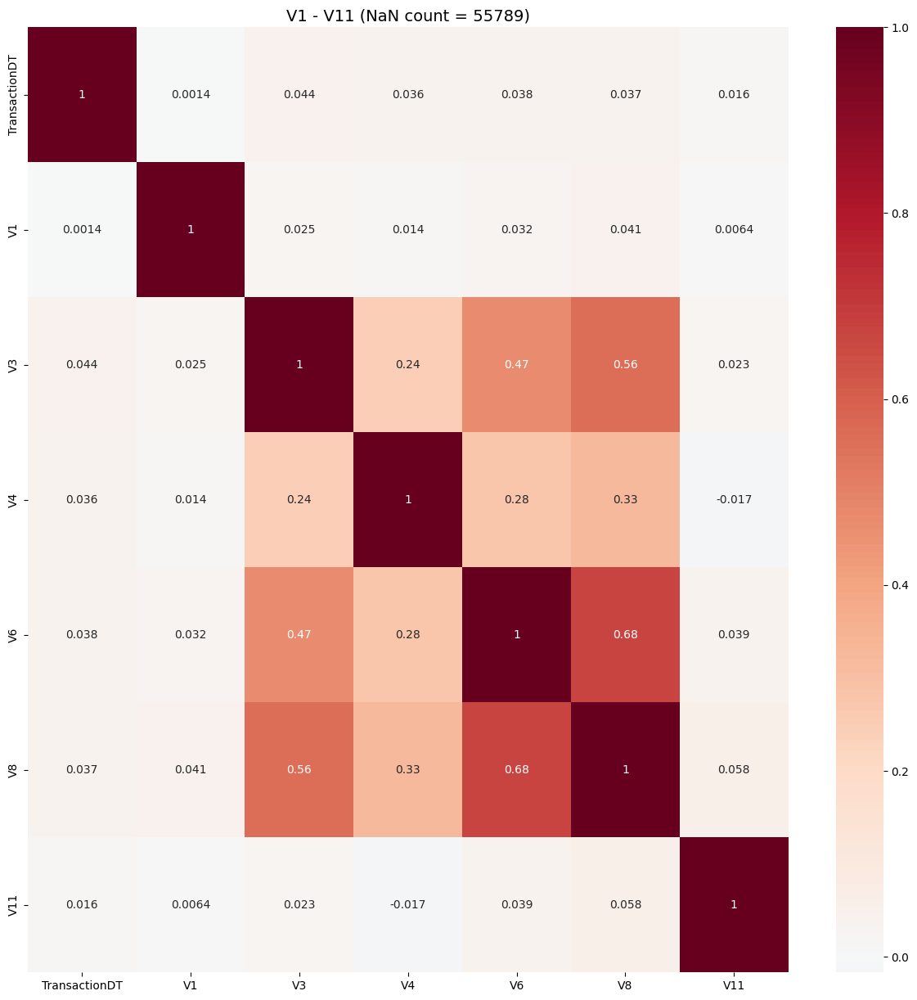

In [21]:
def make_corr(Vs,Vtitle=''):
    cols = ['TransactionDT'] + Vs # include time col for correlational reference
    plt.figure(figsize=(15,15))
    sns.heatmap(train[cols].corr(), cmap='RdBu_r', annot=True, center=0.0) # plot correlation heatmap
    if Vtitle!='': plt.title(Vtitle,fontsize=14)
    else: plt.title(Vs[0]+' - '+Vs[-1],fontsize=14)
    plt.show()
make_corr(Vs,Vtitle)

In [22]:
grps = [[1],[2,3],[4,5],[6,7],[8,9],[10,11]]
def reduce_group(grps,c='V'):
    use = []
    for g in grps:
        mx = 0; vx = g[0]
        for gg in g:
            n = train[c+str(gg)].nunique() # unique value counts for this column
            if n>mx:
                mx = n
                vx = gg
        use.append(vx) # keep representative column for the group
        #print()
    print('Use these',use)
reduce_group(grps)

Use these [1, 3, 4, 6, 8, 11]


# V12-V34

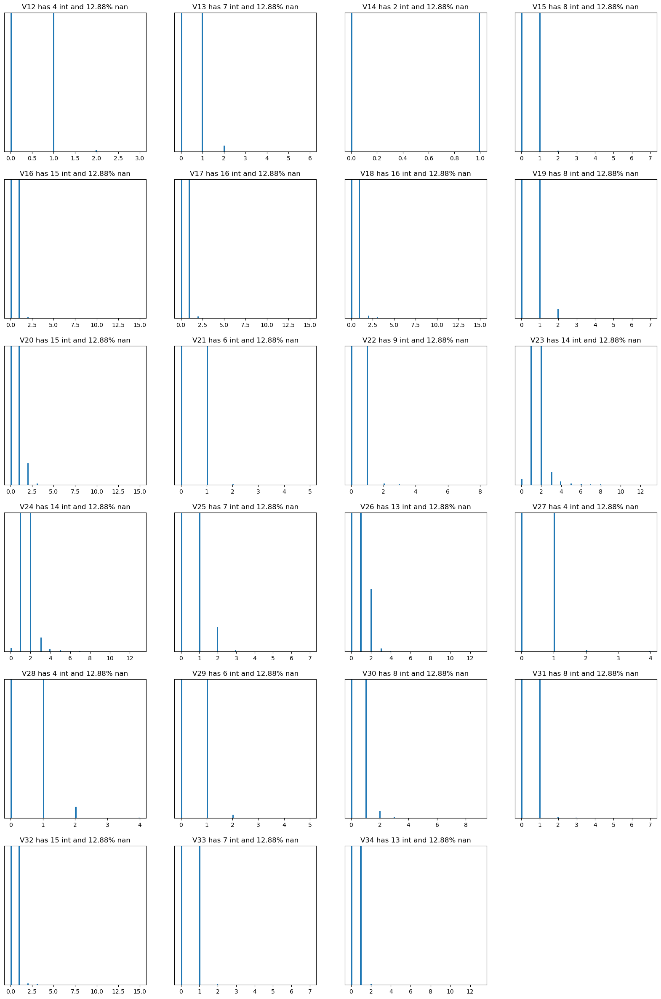

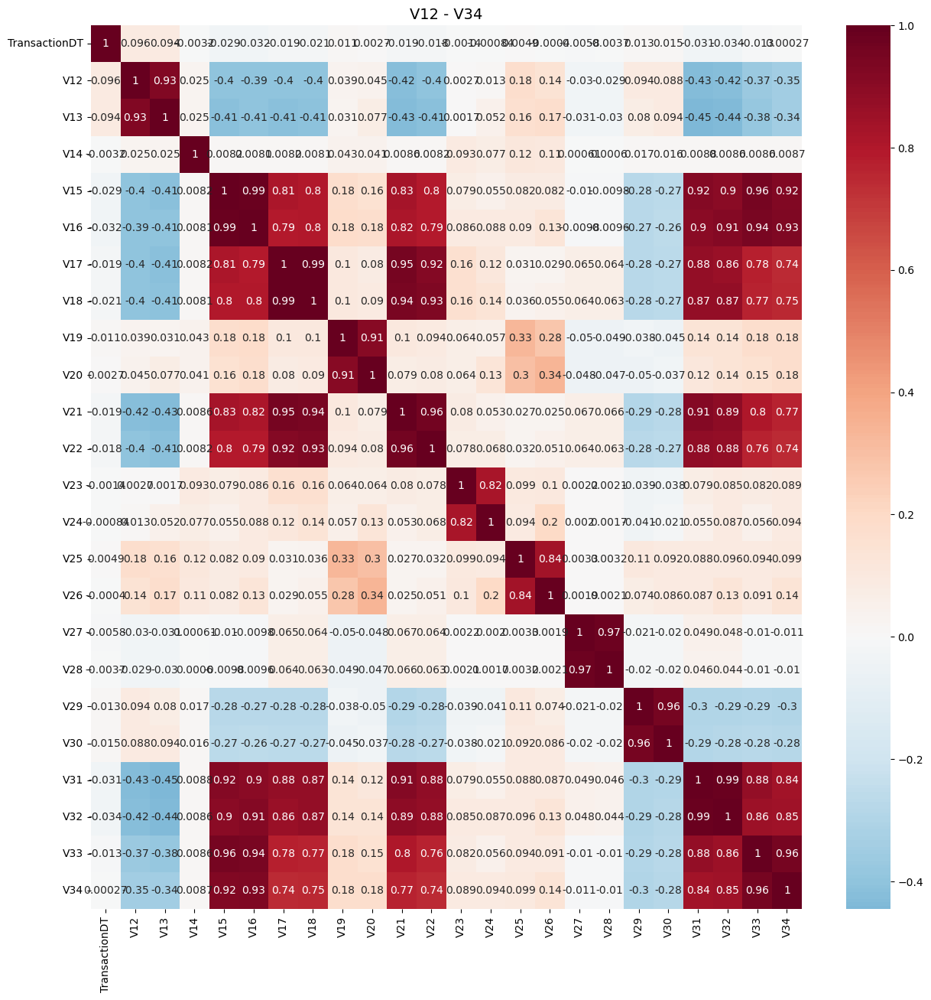

In [ ]:
Vs = nans_groups[76073]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[12,13],[14],[15,16,17,18,21,22,31,32,33,34],[19,20],[23,24],[25,26],[27,28],[29,30]]
reduce_group(grps)

Use these [13, 14, 17, 20, 23, 26, 27, 30]


# V35-V52

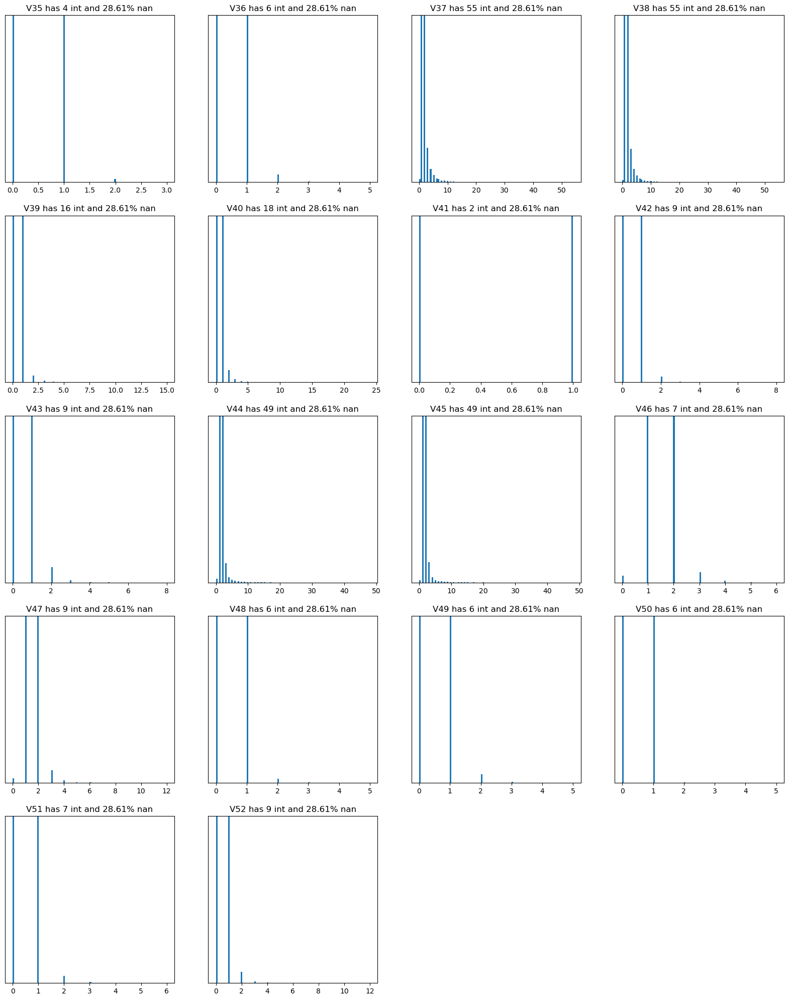

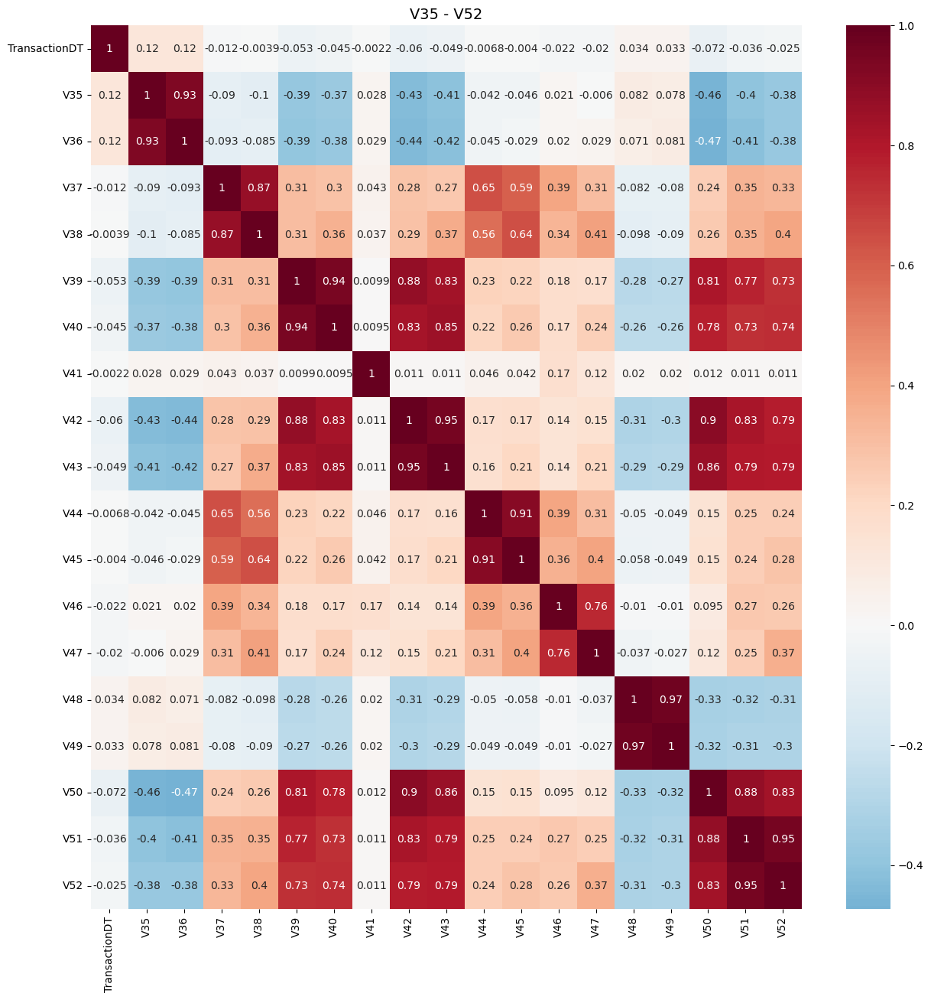

In [ ]:
Vs = nans_groups[168969]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[35,36],[37,38],[39,40,42,43,50,51,52],[41],[44,45],[46,47],[48,49]]
reduce_group(grps)

Use these [36, 37, 40, 41, 44, 47, 48]


# V53-V74

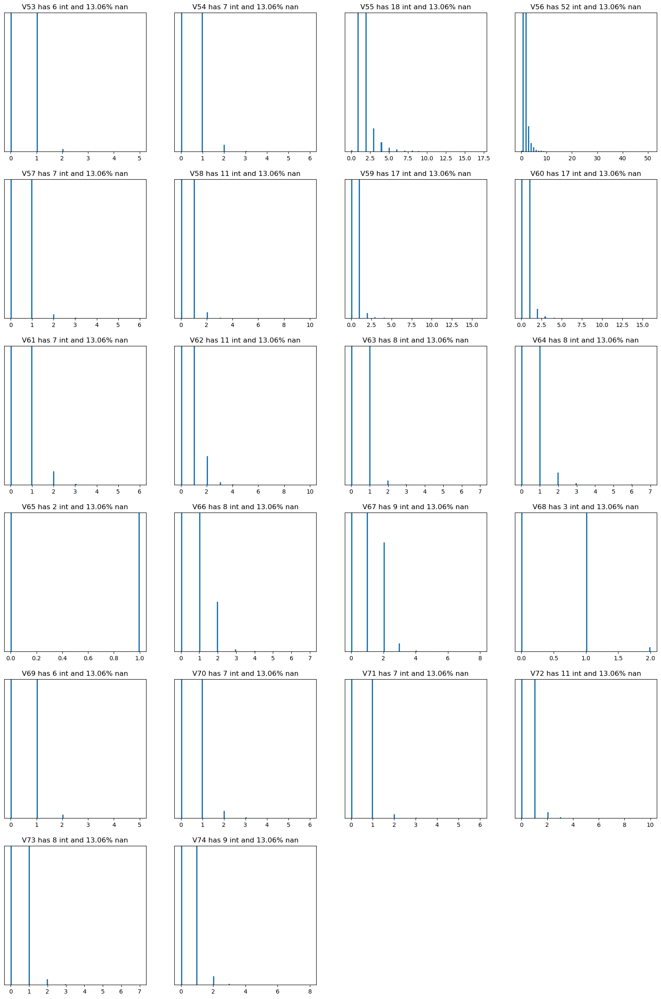

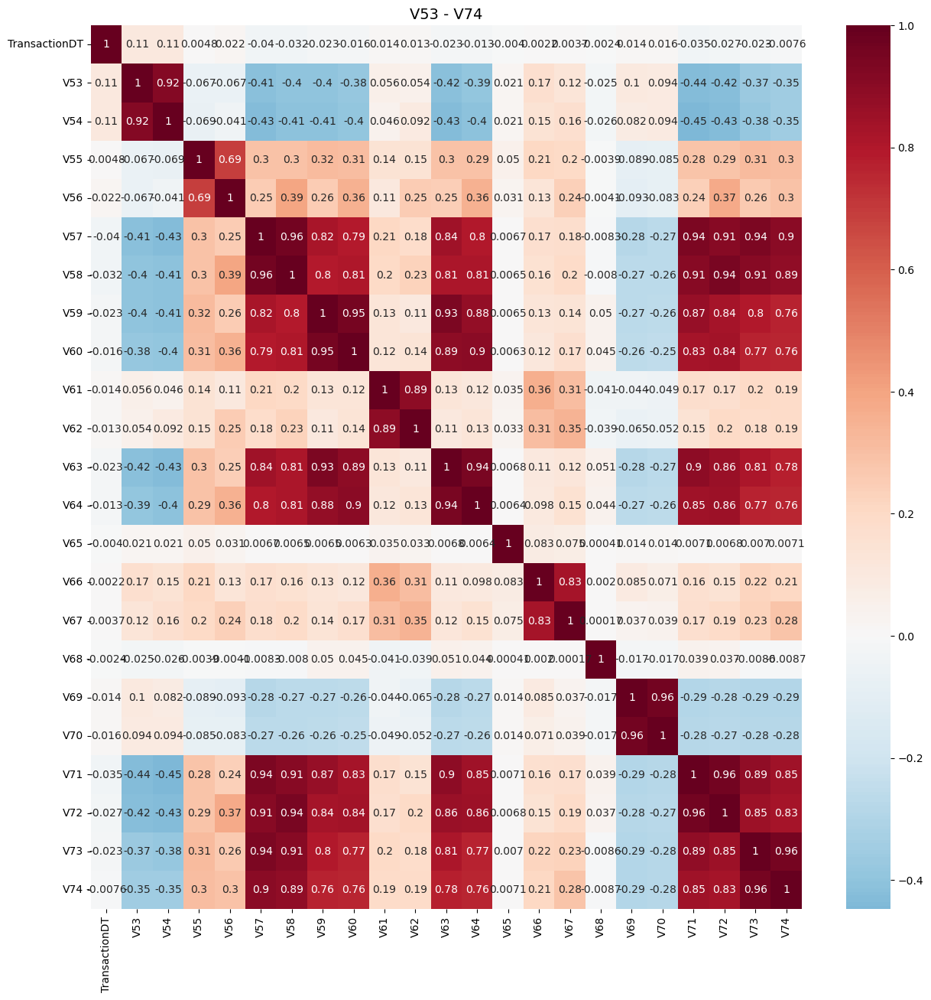

In [ ]:
Vs = nans_groups[77096]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[53,54],[55,56],[57,58,59,60,63,64,71,72,73,74],[61,62],[65],[66,67],[68],[69,70]]
reduce_group(grps)

Use these [54, 56, 59, 62, 65, 67, 68, 70]


# V75-V94

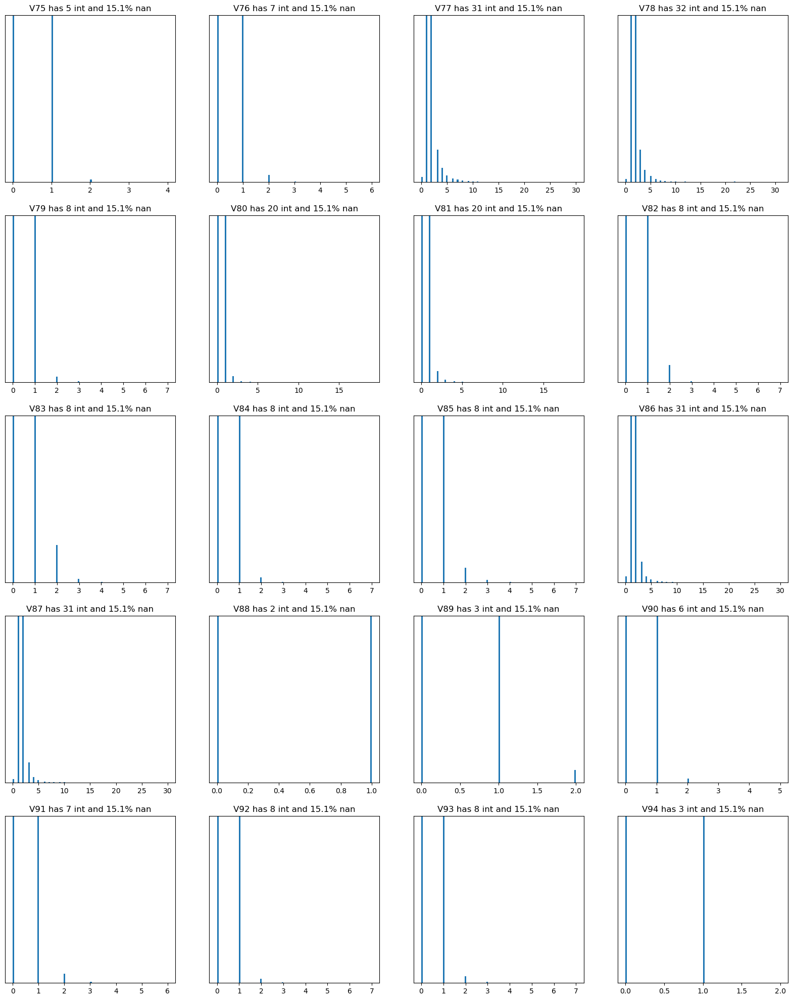

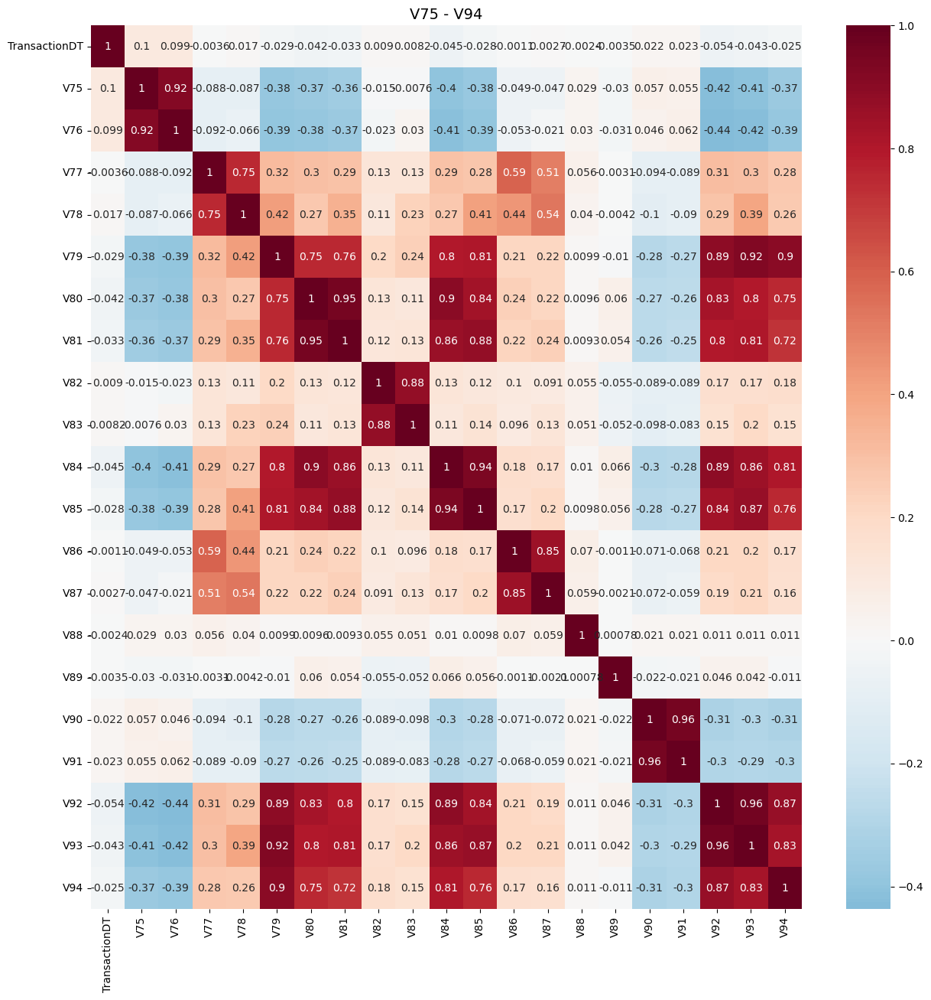

In [ ]:
Vs = nans_groups[89164]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[75,76],[77,78],[79,80,81,84,85,92,93,94],[82,83],[86,87],[88],[89],[90,91]]
reduce_group(grps)

Use these [76, 78, 80, 82, 86, 88, 89, 91]


# V95-V137

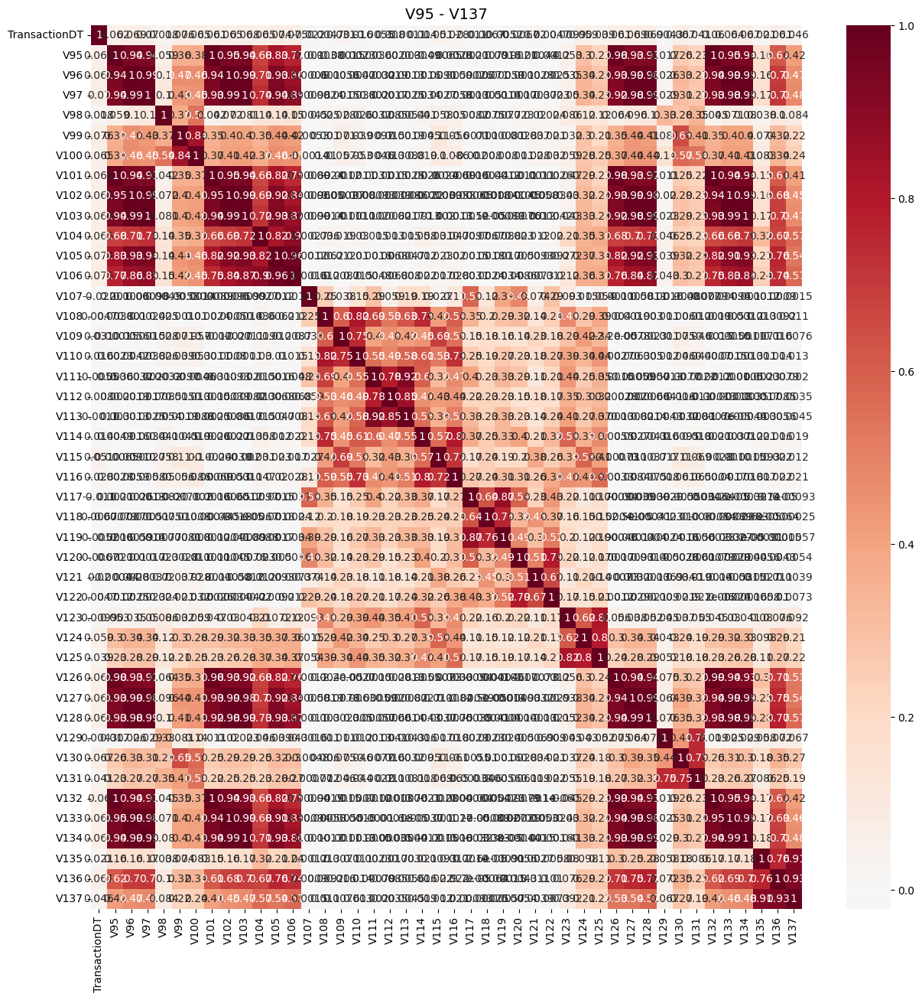

In [ ]:
Vs = nans_groups[314]
make_corr(Vs)

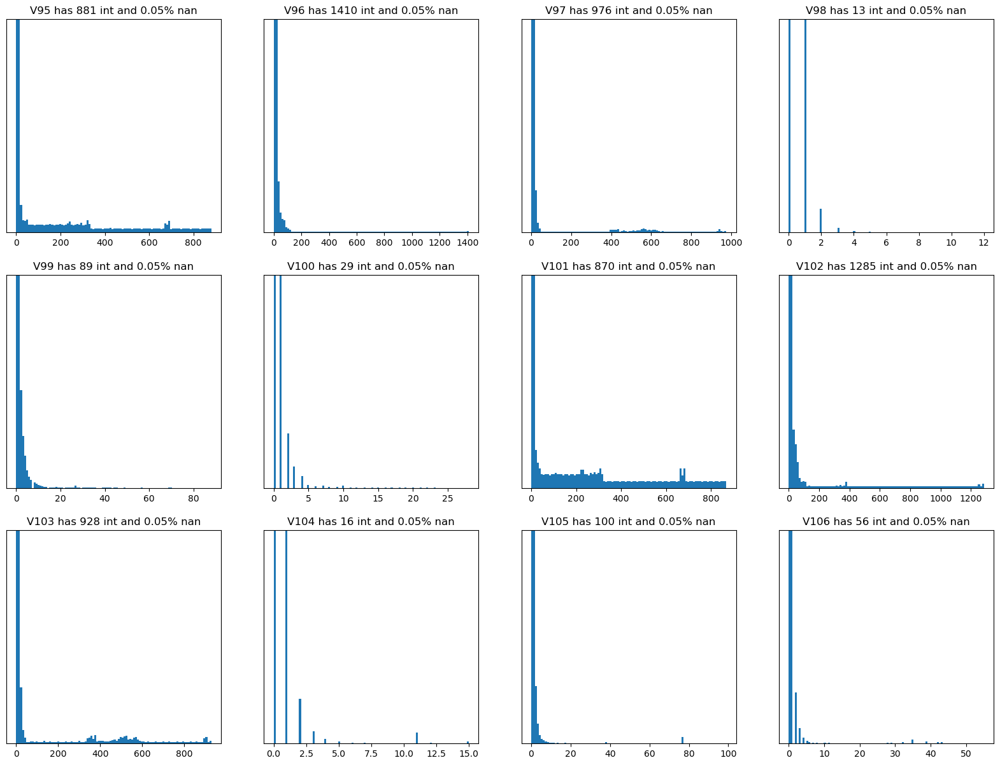

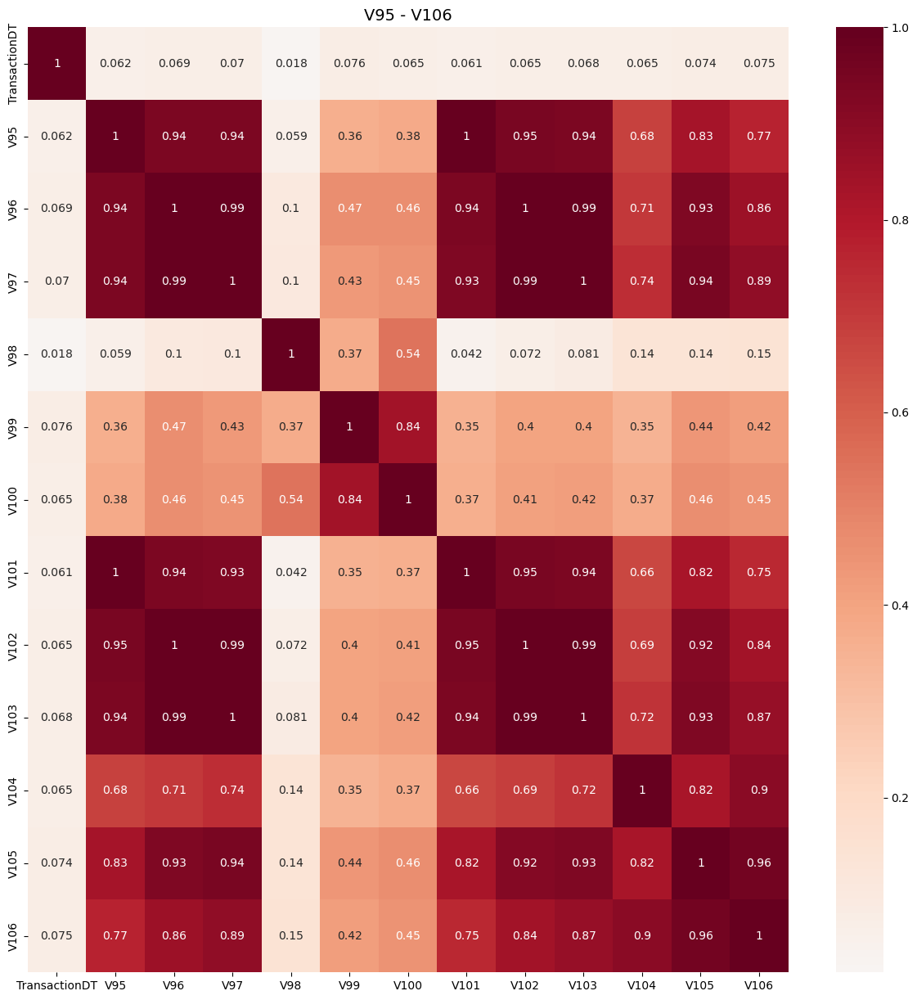

In [ ]:
Vs = ['V'+str(x) for x in range(95,107)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[95,96,97,101,102,103,105,106],[98],[99,100],[104]]
reduce_group(grps)

Use these [96, 98, 99, 104]


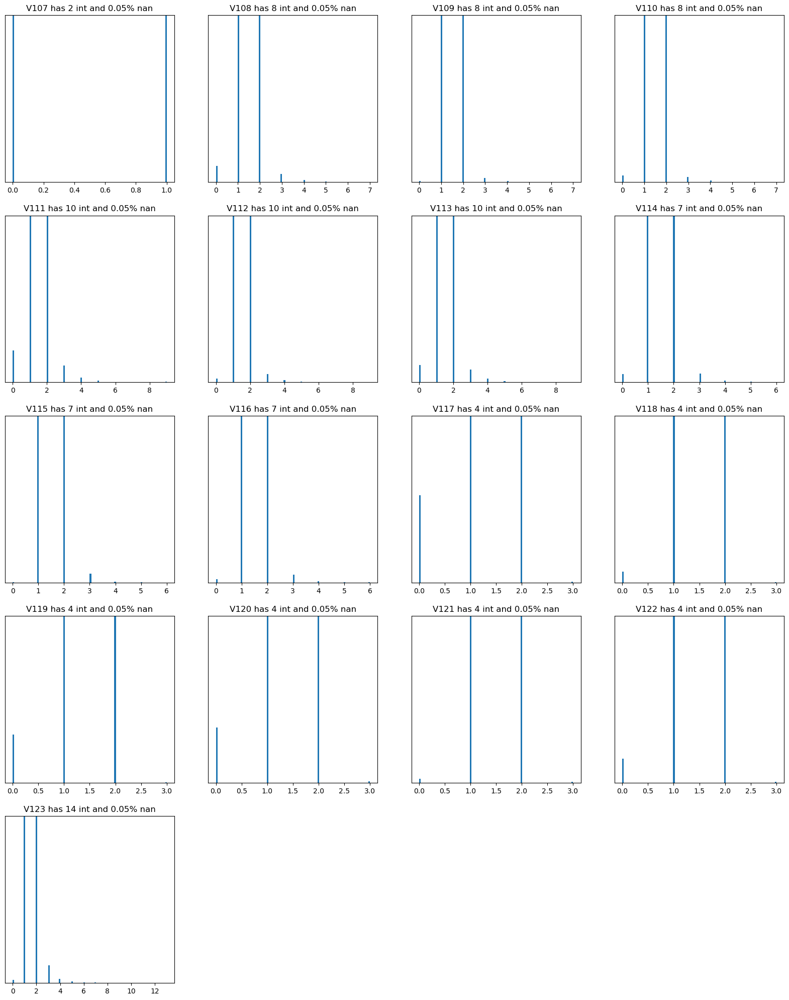

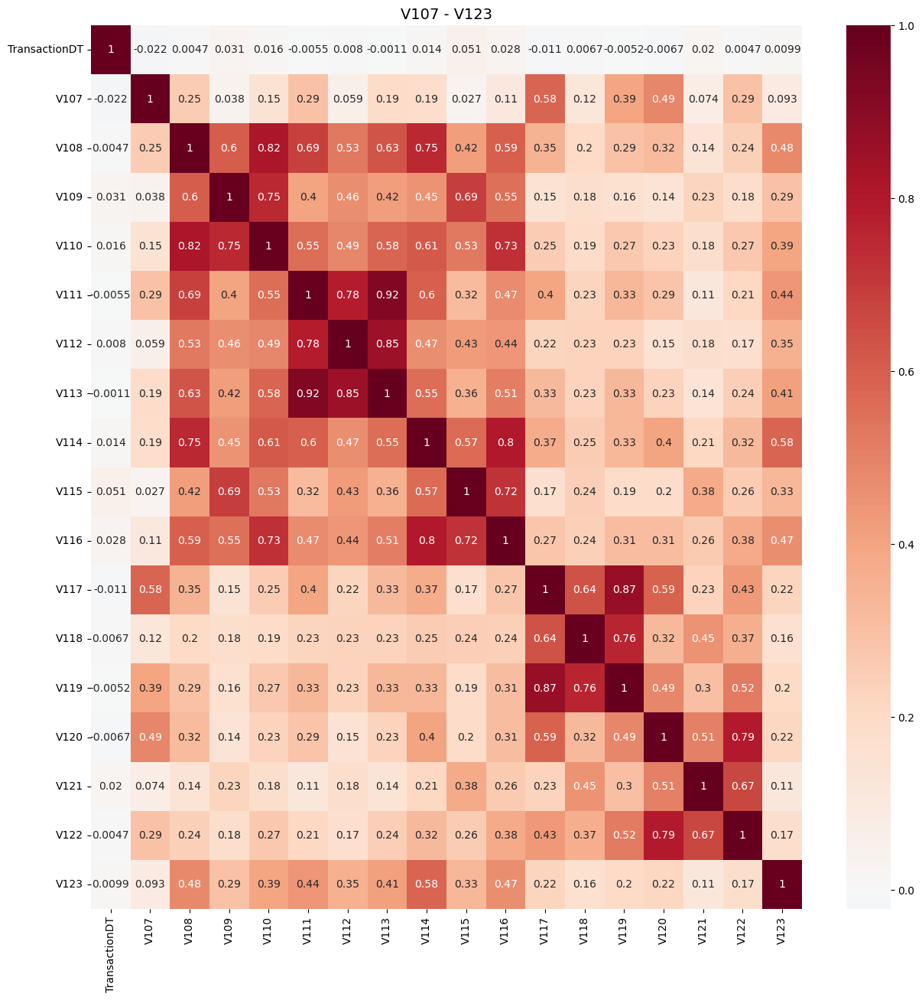

In [ ]:
Vs = ['V'+str(x) for x in range(107,124)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[107],[108,109,110,114],[111,112,113],[115,116],[117,118,119],[120,122],[121],[123]]
reduce_group(grps)

Use these [107, 108, 111, 115, 117, 120, 121, 123]


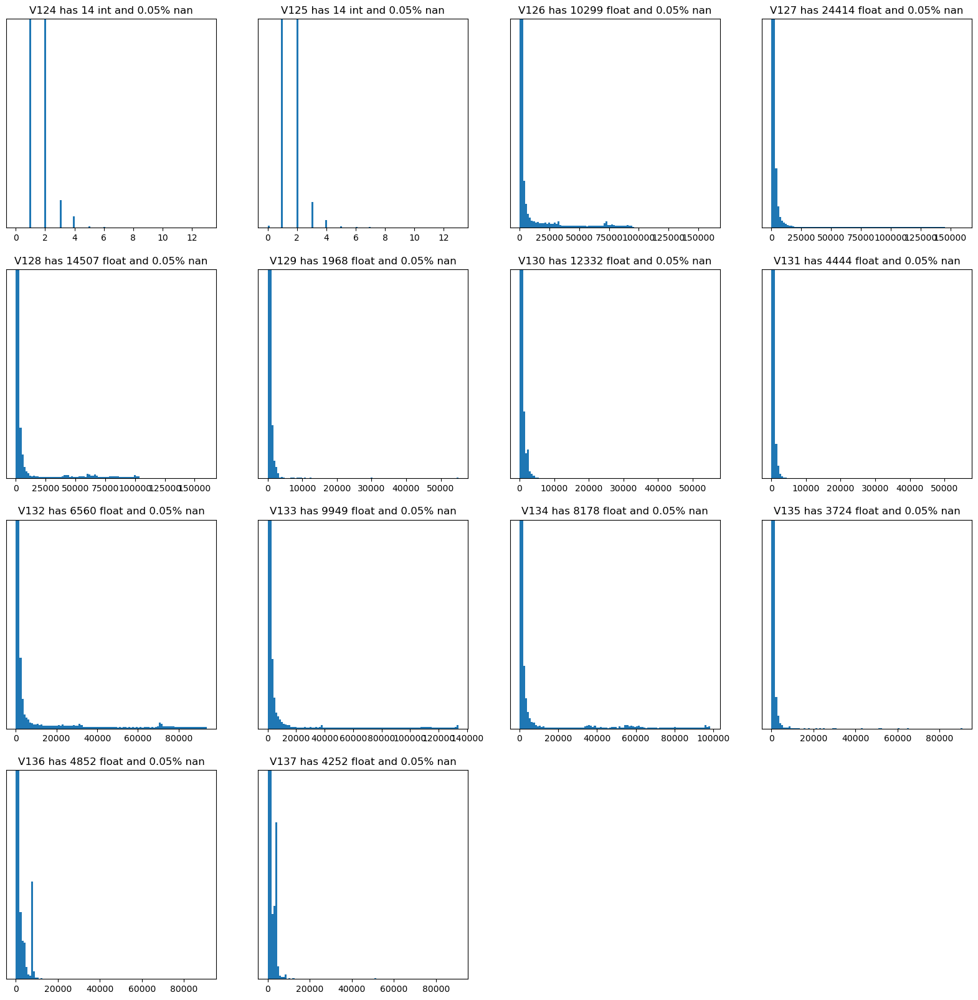

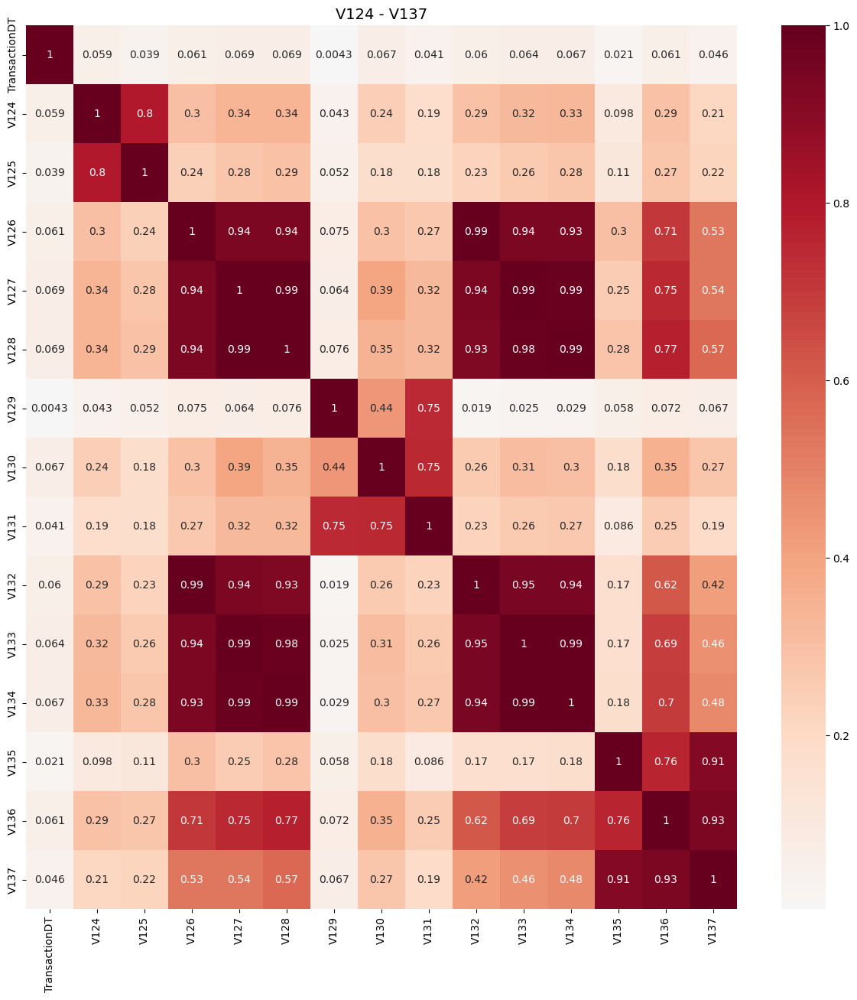

In [ ]:
Vs = ['V'+str(x) for x in range(124,138)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[124,125],[126,127,128,132,133,134],[129],[130,131],[135,136,137]]
reduce_group(grps)

Use these [124, 127, 129, 130, 136]


# V138-V163

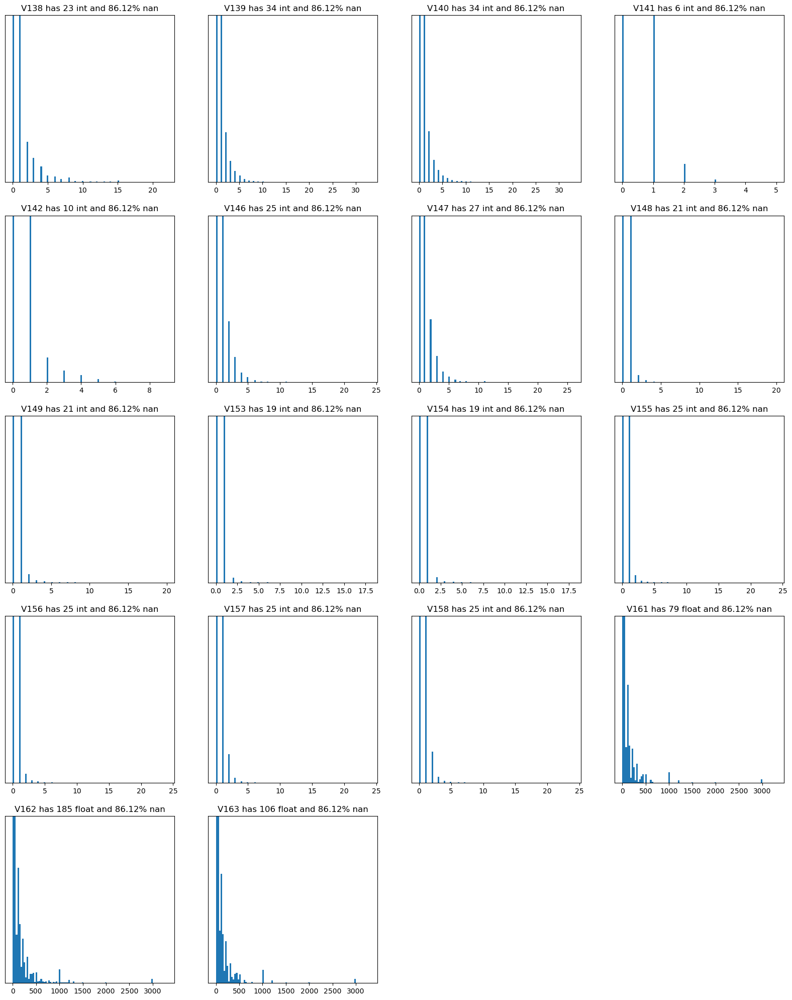

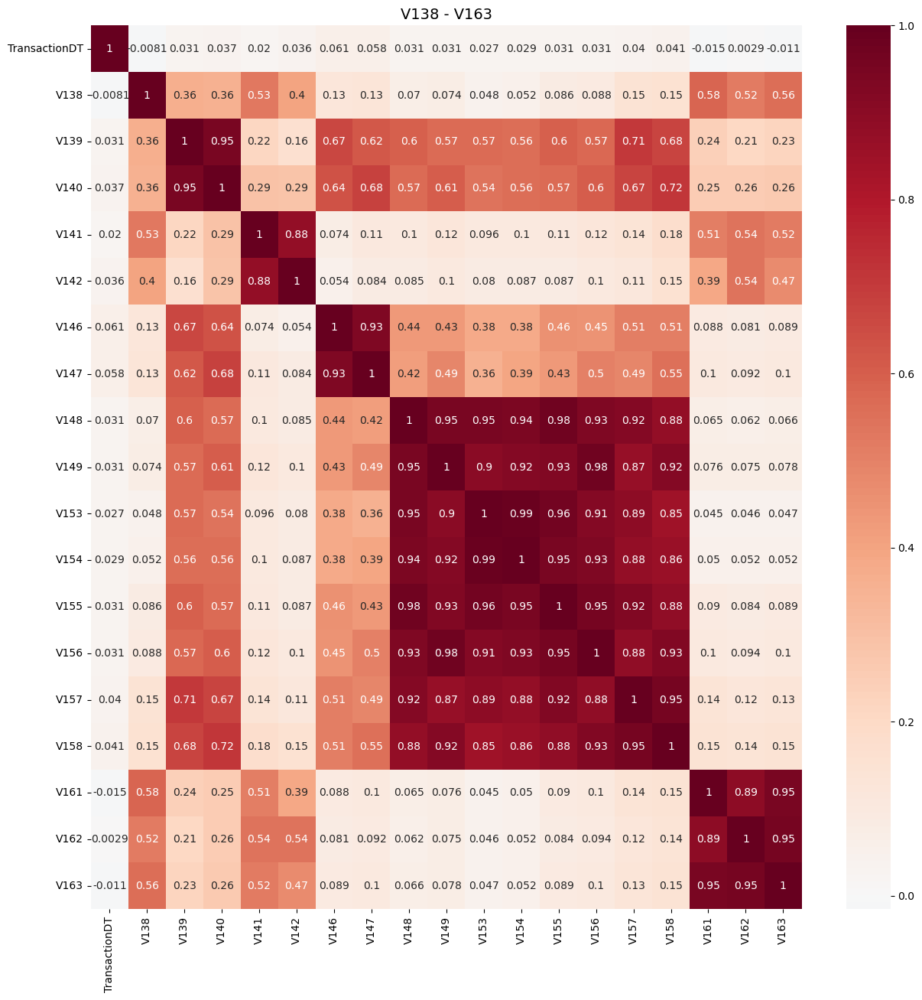

In [ ]:
Vs = nans_groups[508595]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[138],[139,140],[141,142],[146,147],[148,149,153,154,156,157,158],[161,162,163]]
reduce_group(grps)

Use these [138, 139, 142, 147, 156, 162]


# V143-V166

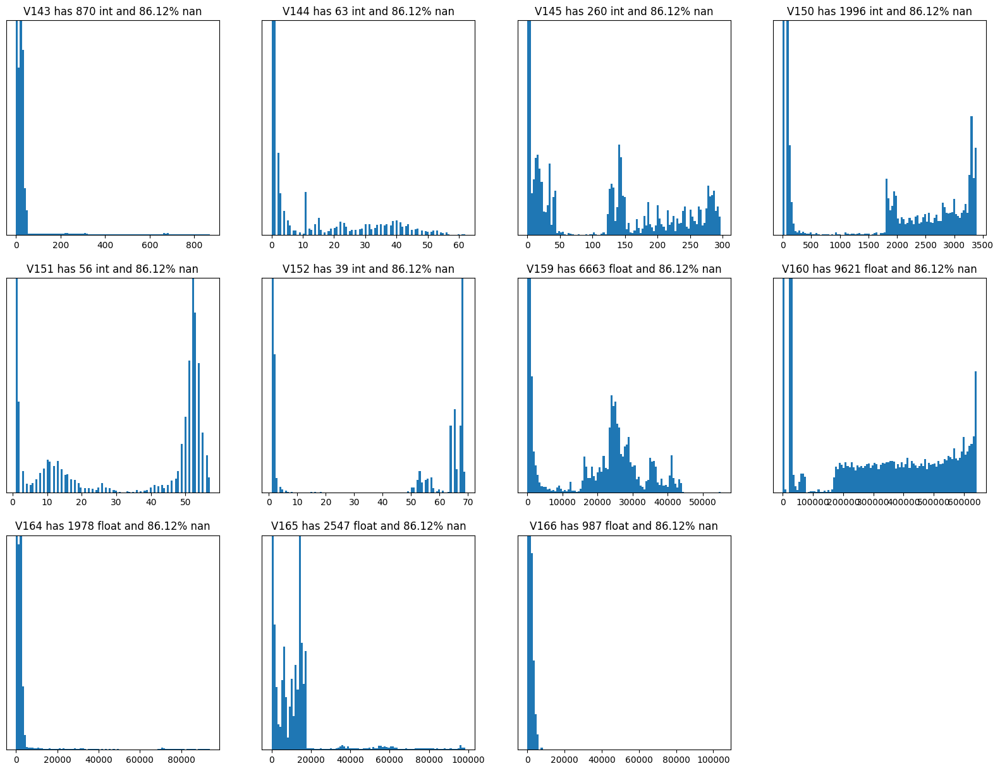

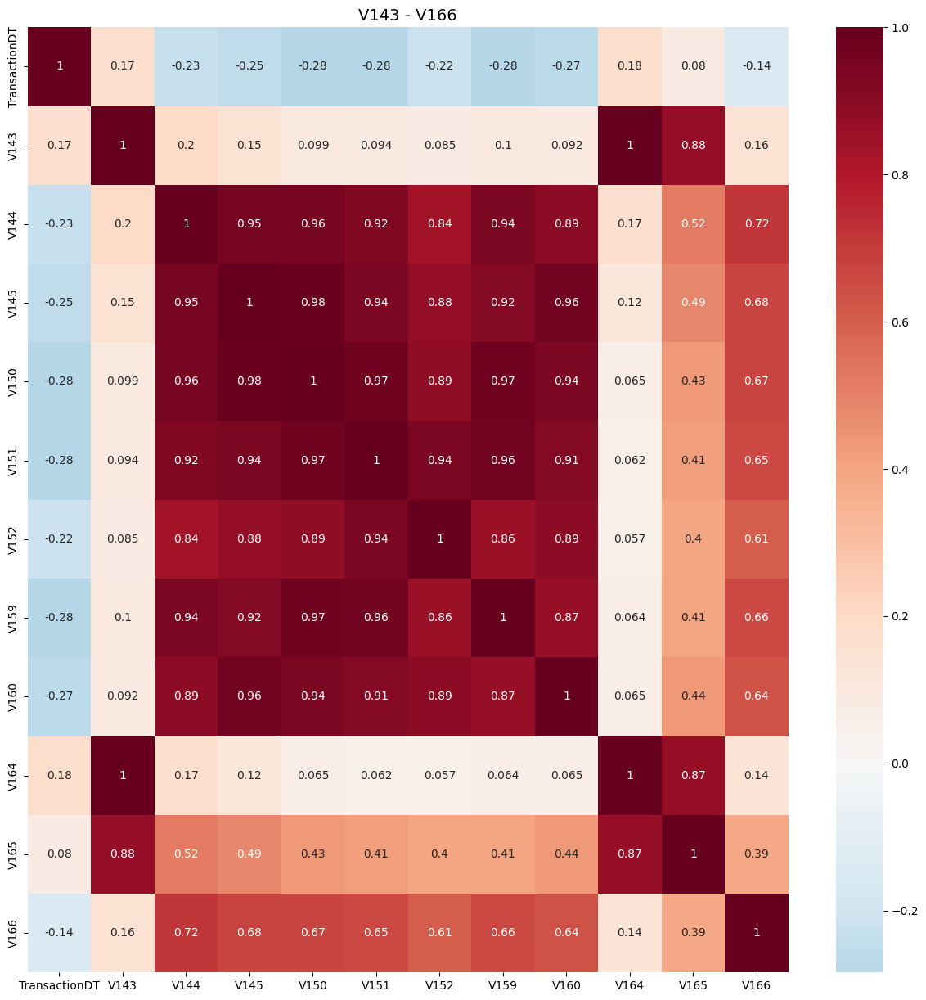

In [ ]:
Vs = nans_groups[508589]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[143,164,165],[144,145,150,151,152,159,160],[166]]
reduce_group(grps)

Use these [165, 160, 166]


# V167-V216

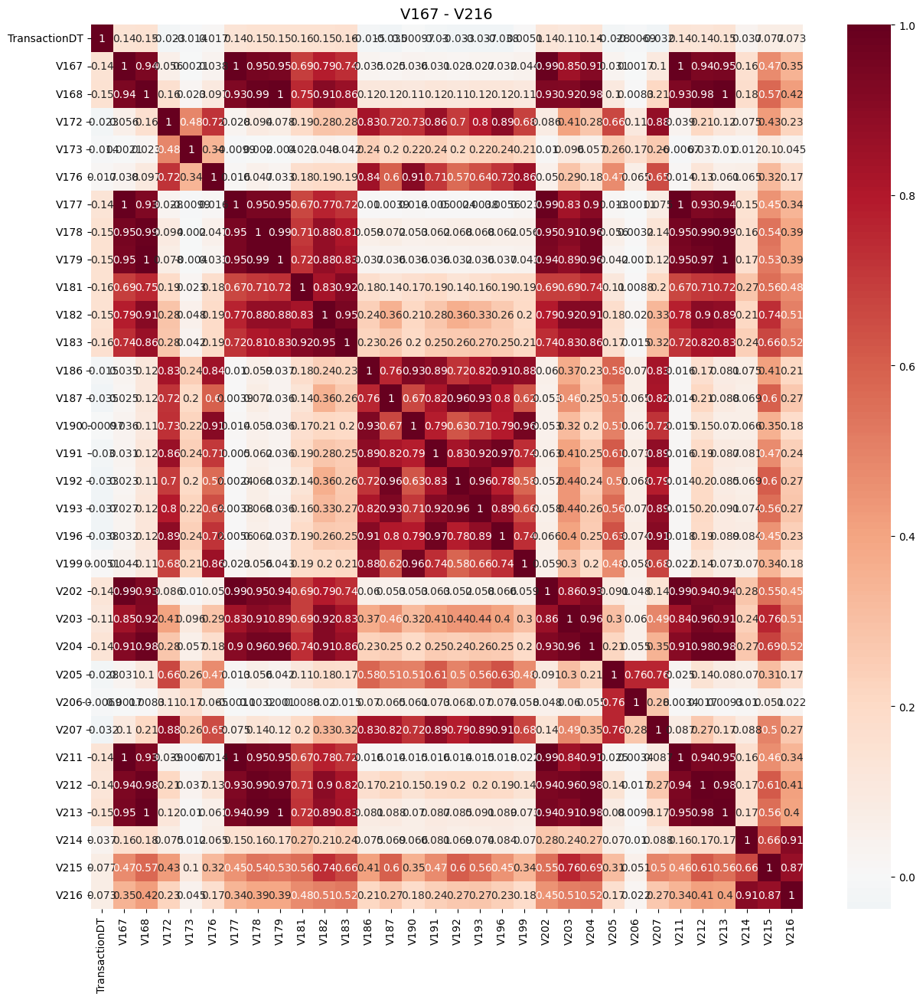

In [ ]:
Vs = [x for x in nans_groups[450909]]
make_corr(Vs)

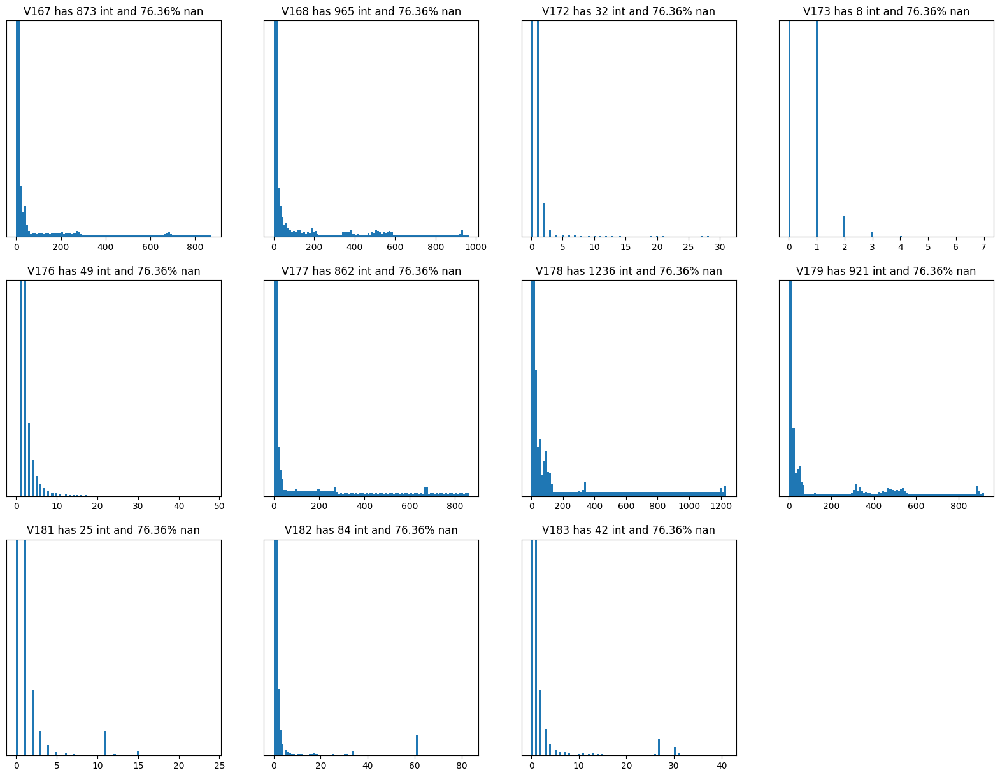

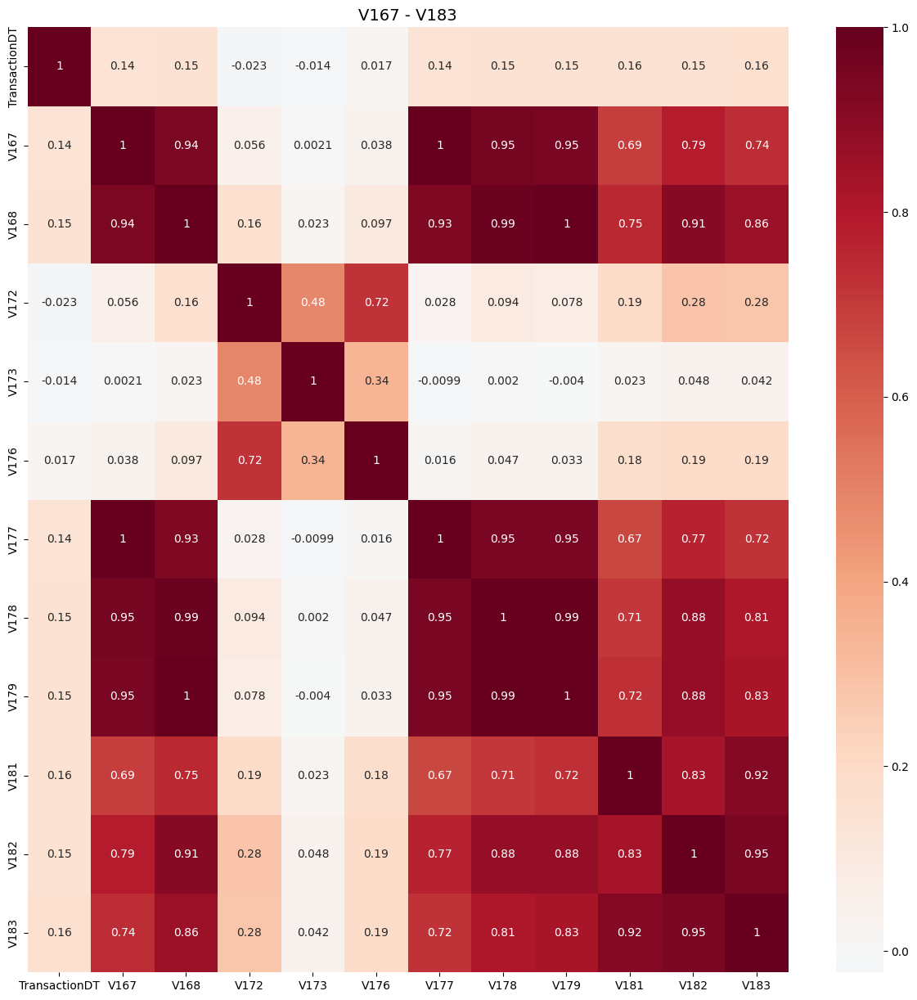

In [ ]:
Vs = [x for x in nans_groups[450909] if int(x[1:])<186]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[167,168,177,178,179],[172,176],[173],[181,182,183]]
reduce_group(grps)

Use these [178, 176, 173, 182]


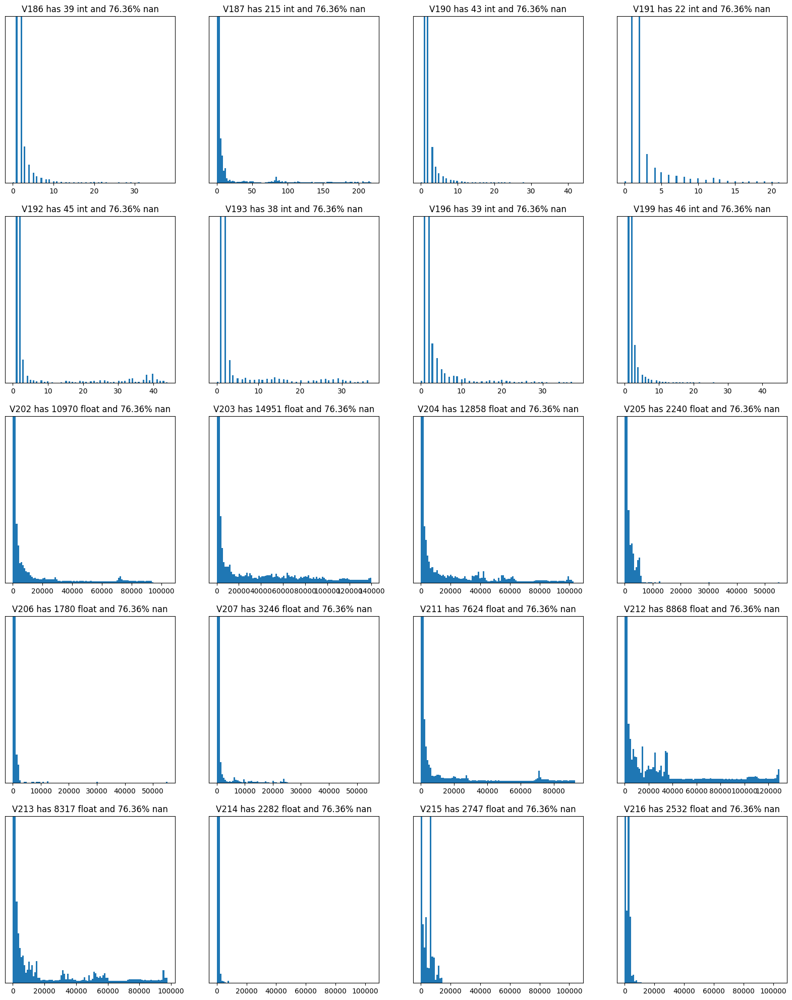

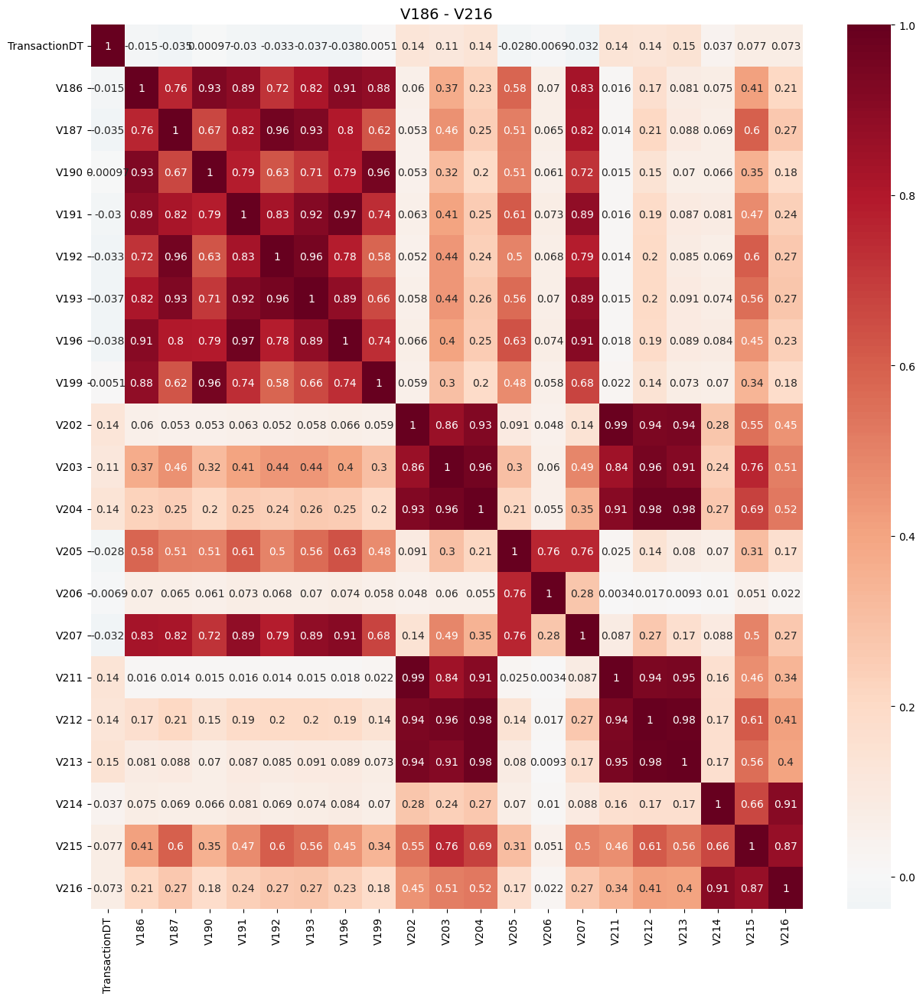

In [ ]:
Vs = [x for x in nans_groups[450909] if (int(x[1:])>183)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[186,187,190,191,192,193,196,199],[202,203,204,211,212,213],[205,206],[207],[214,215,216]]
reduce_group(grps)

Use these [187, 203, 205, 207, 215]


# V169-V210

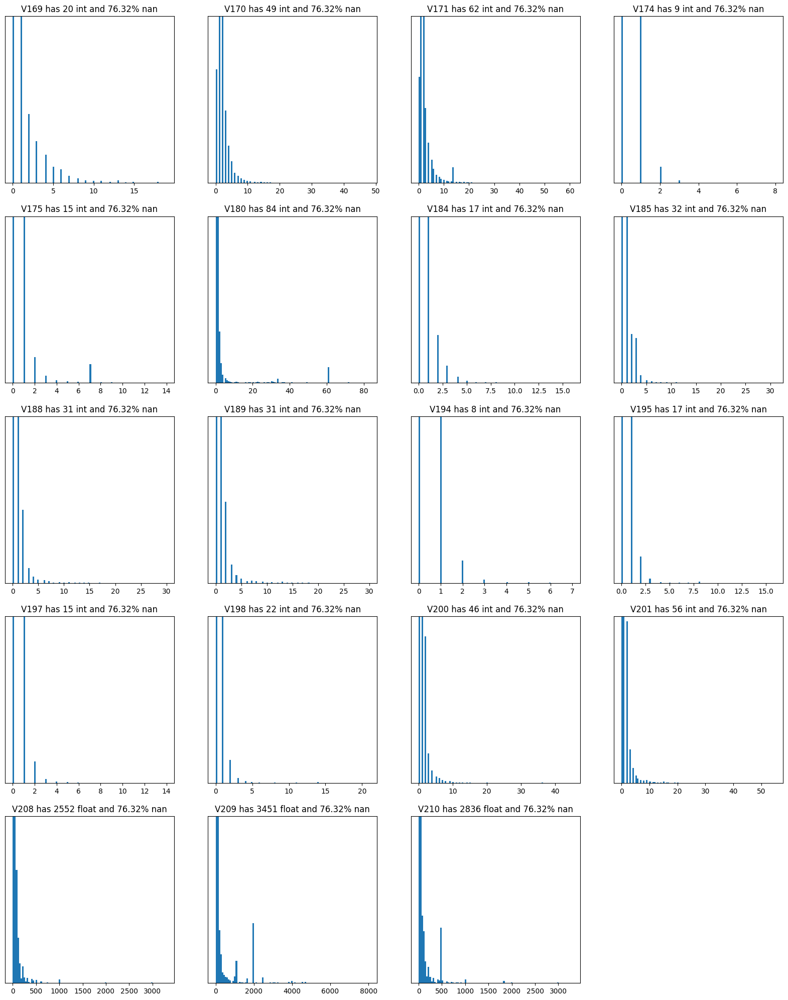

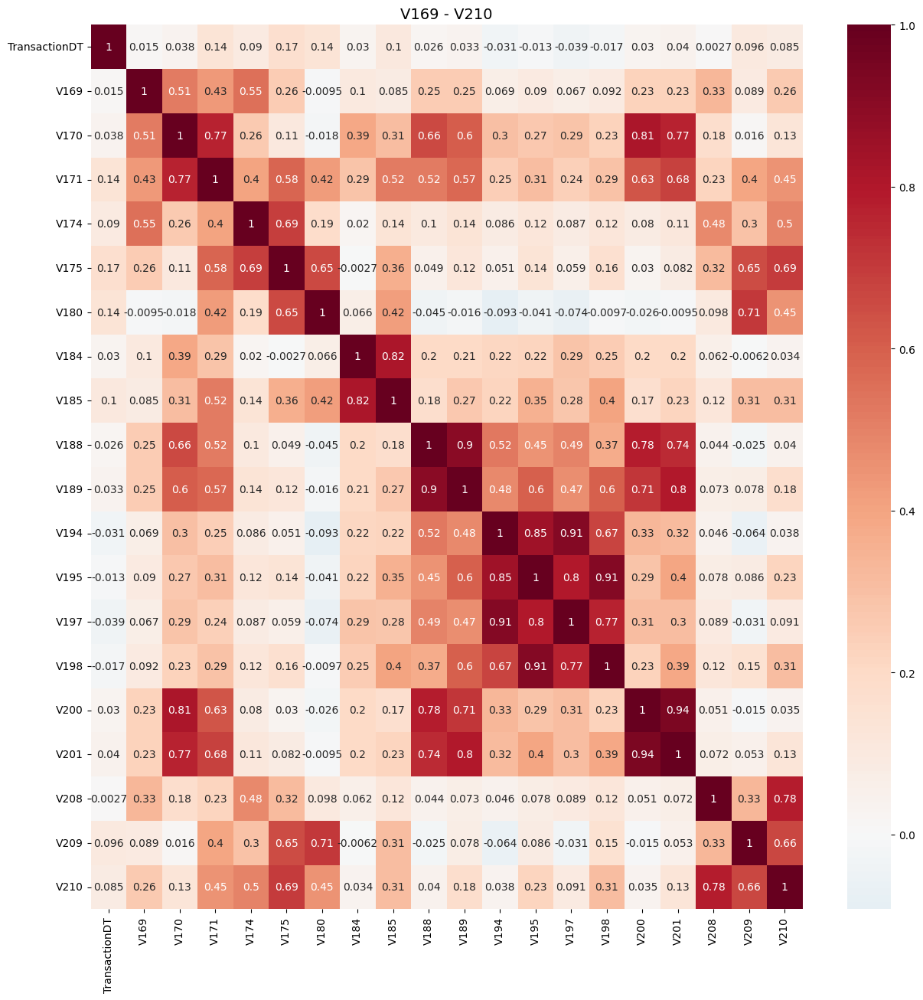

In [ ]:
Vs = nans_groups[450721]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[169],[170,171,200,201],[174,175],[180],[184,185],[188,189],[194,195,197,198],[208,210],[209]]
reduce_group(grps)

Use these [169, 171, 175, 180, 185, 188, 198, 210, 209]


# V217-V278

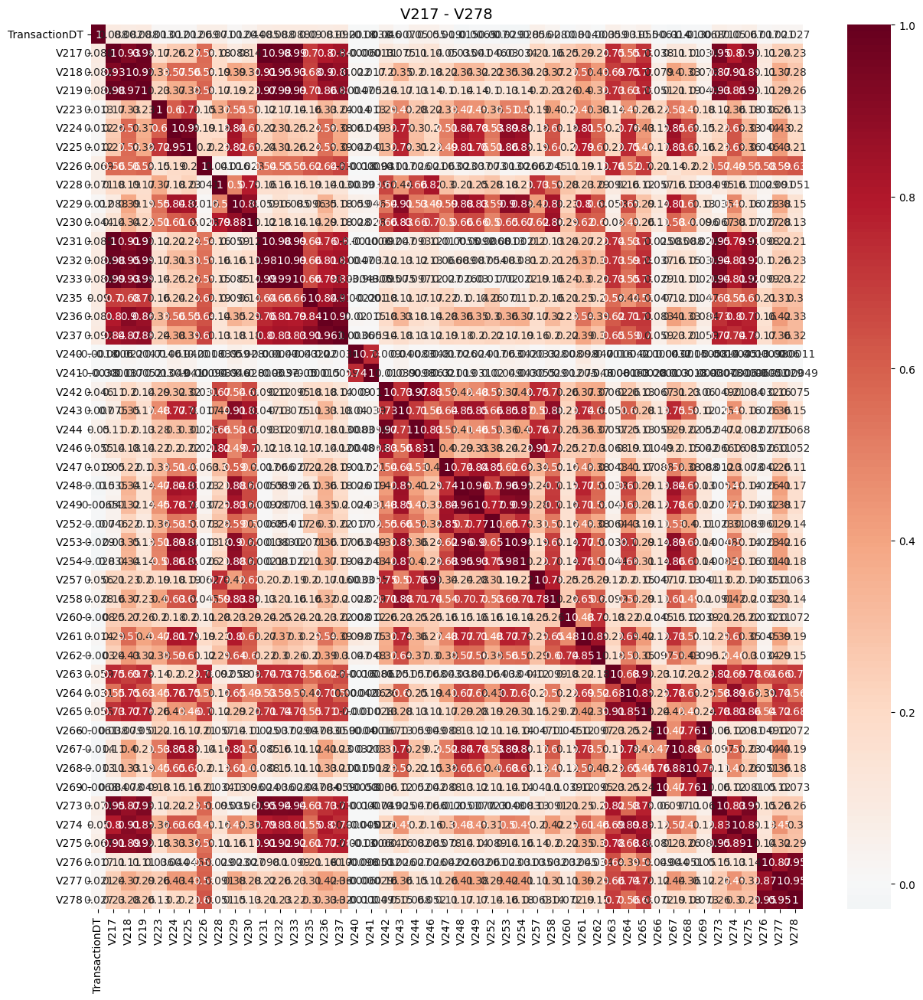

In [ ]:
Vs = [x for x in nans_groups[460110]]
make_corr(Vs)

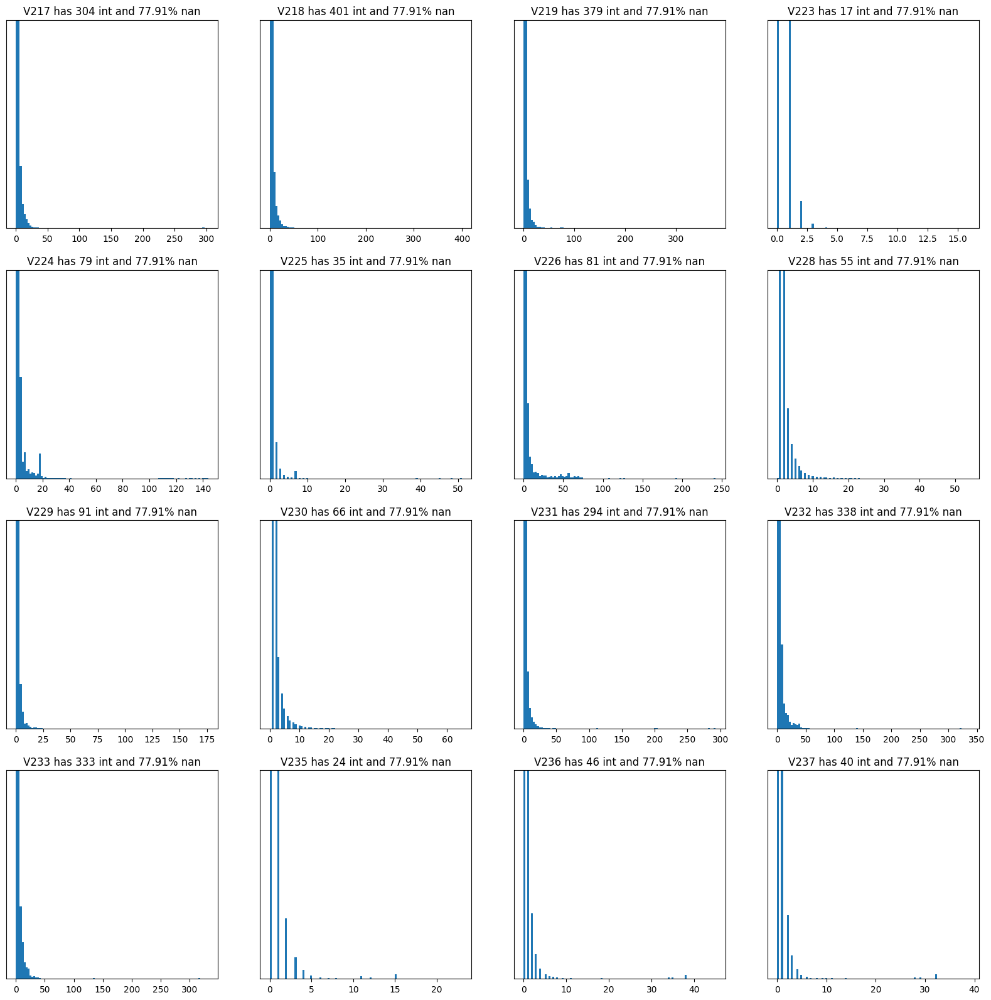

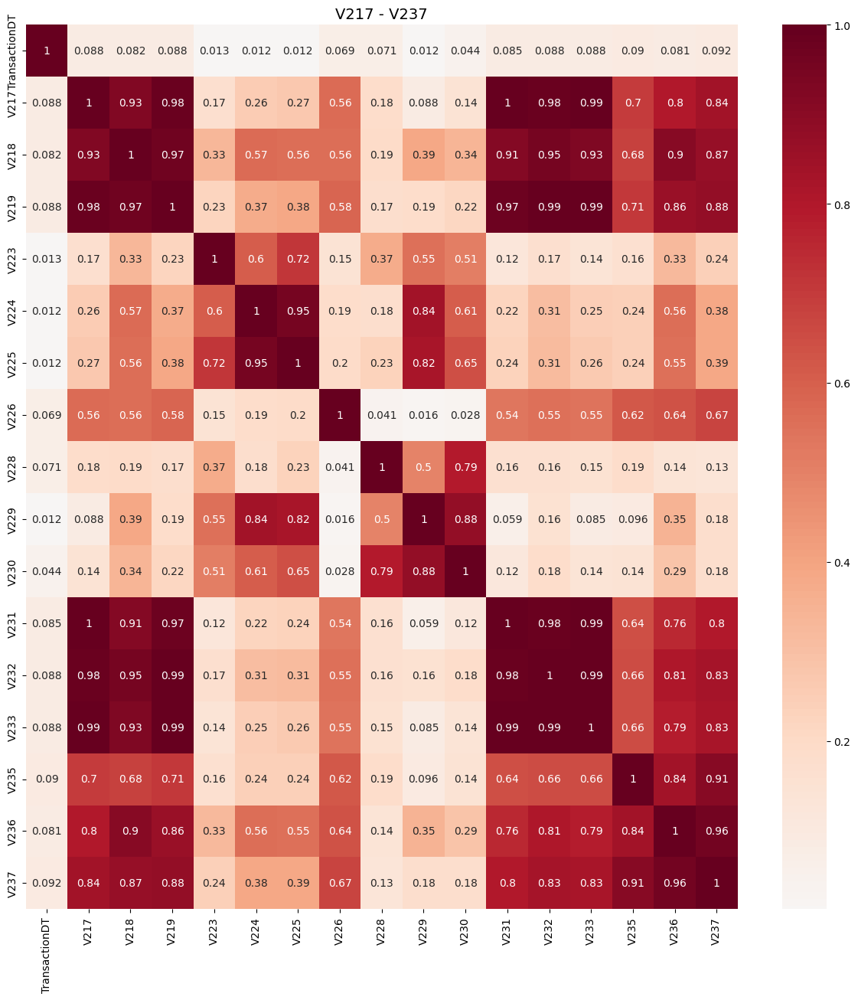

In [ ]:
Vs = [x for x in nans_groups[460110] if int(x[1:])<240]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[217,218,219,231,232,233,236,237],[223],[224,225],[226],[228],[229,230],[235]]
reduce_group(grps)

Use these [218, 223, 224, 226, 228, 229, 235]


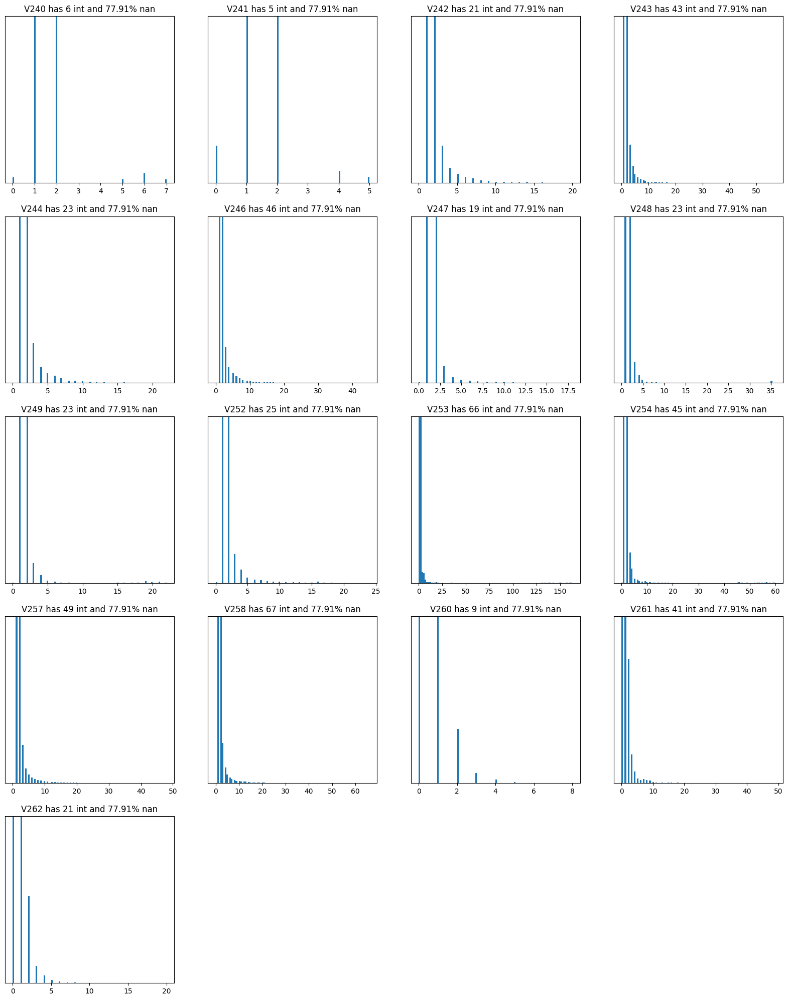

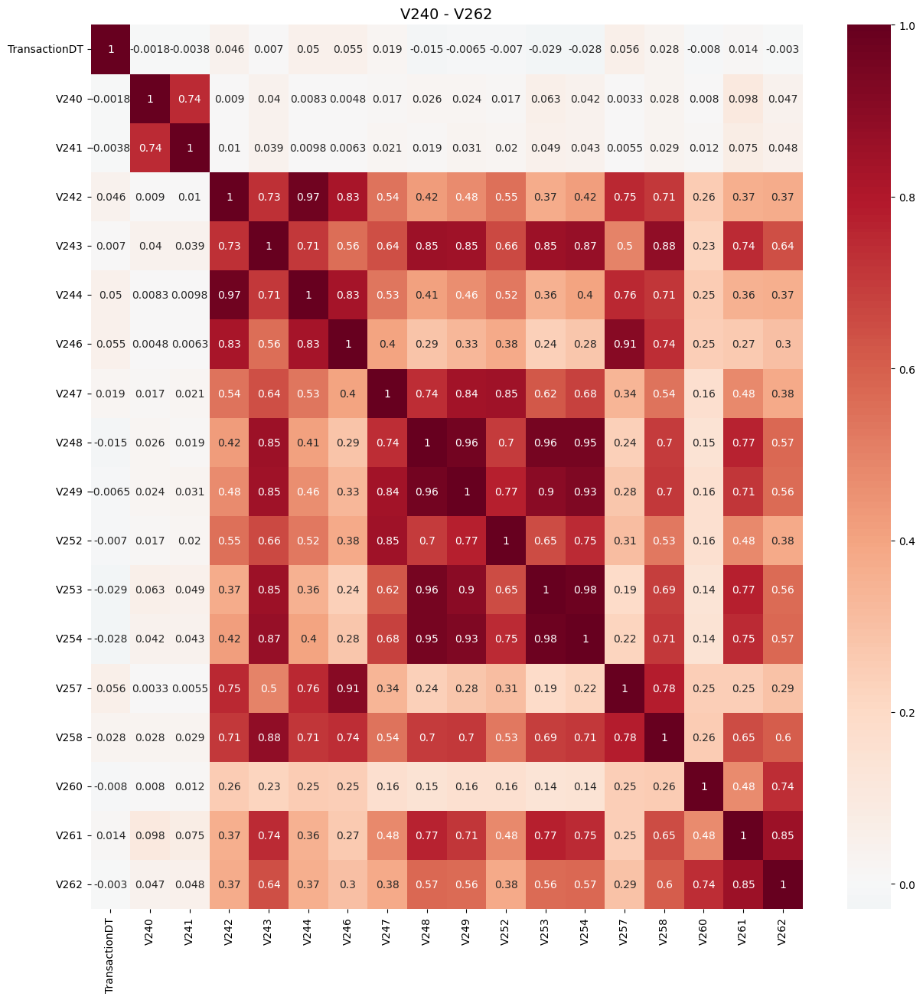

In [ ]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>237)&(int(x[1:])<263)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[240,241],[242,243,244,258],[246,257],[247,248,249,253,254],[252],[260],[261,262]]
reduce_group(grps)

Use these [240, 258, 257, 253, 252, 260, 261]


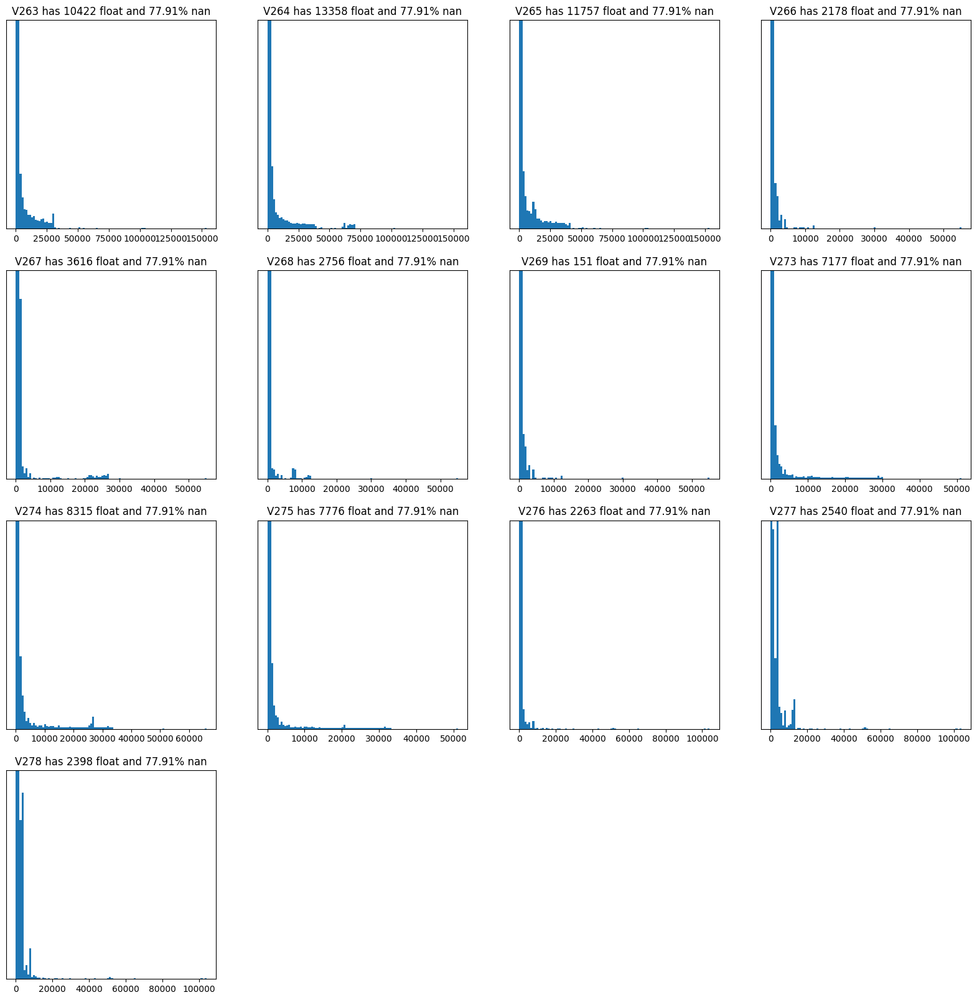

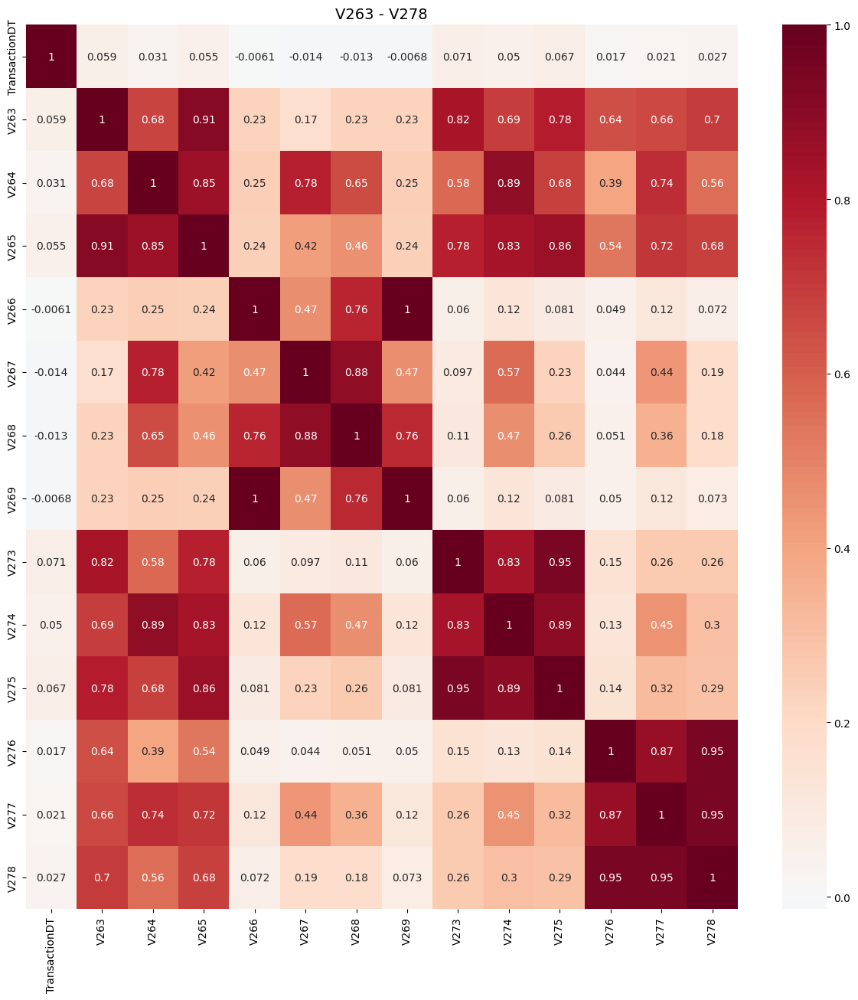

In [ ]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>262)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[263,265,264],[266,269],[267,268],[273,274,275],[276,277,278]]
reduce_group(grps)

Use these [264, 266, 267, 274, 277]


# V220-V272

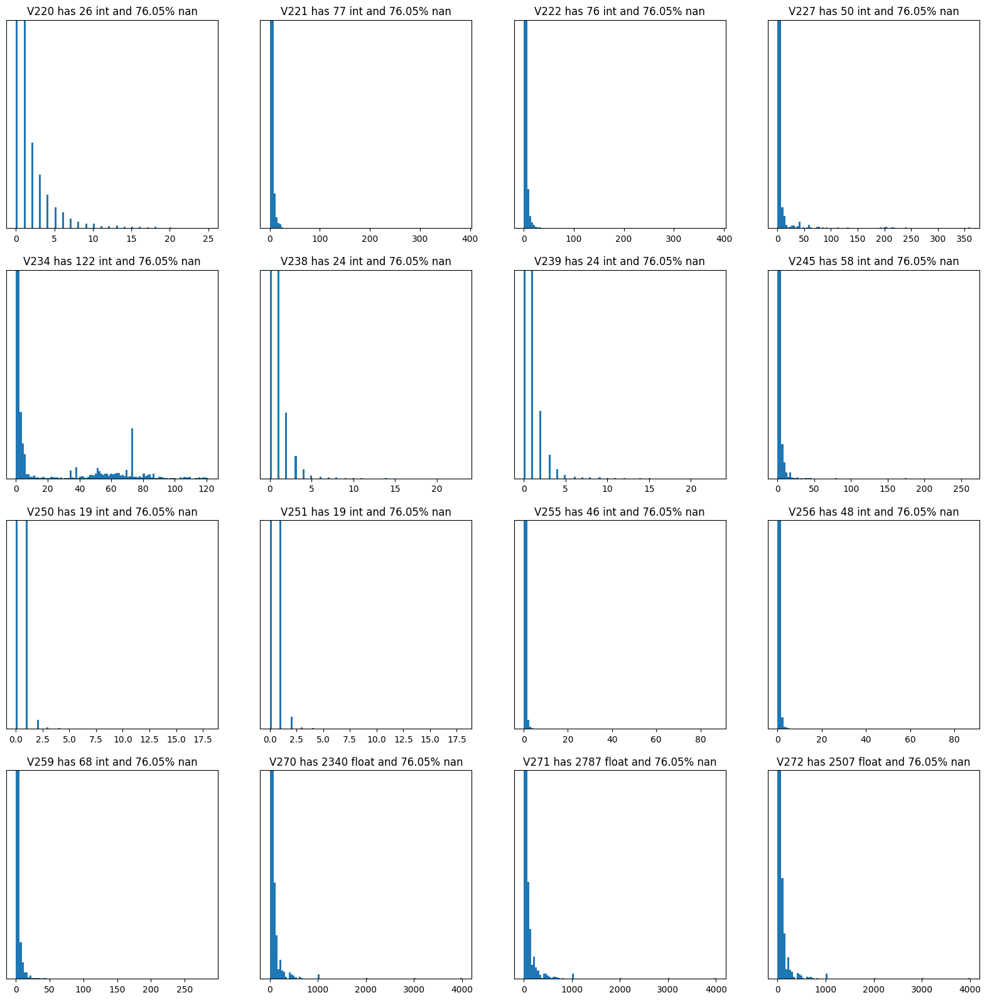

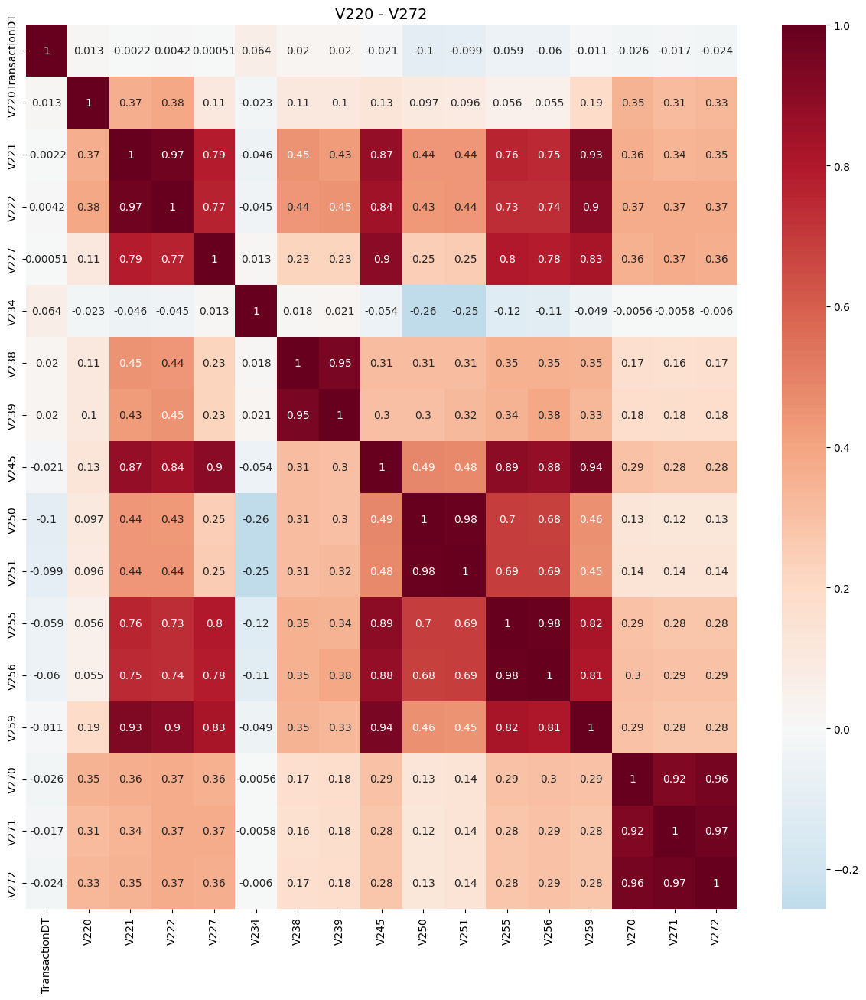

In [ ]:
Vs = nans_groups[449124]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[220],[221,222,227,245,255,256,259],[234],[238,239],[250,251],[270,271,272]]
reduce_group(grps)

Use these [220, 221, 234, 238, 250, 271]


# V279-V321

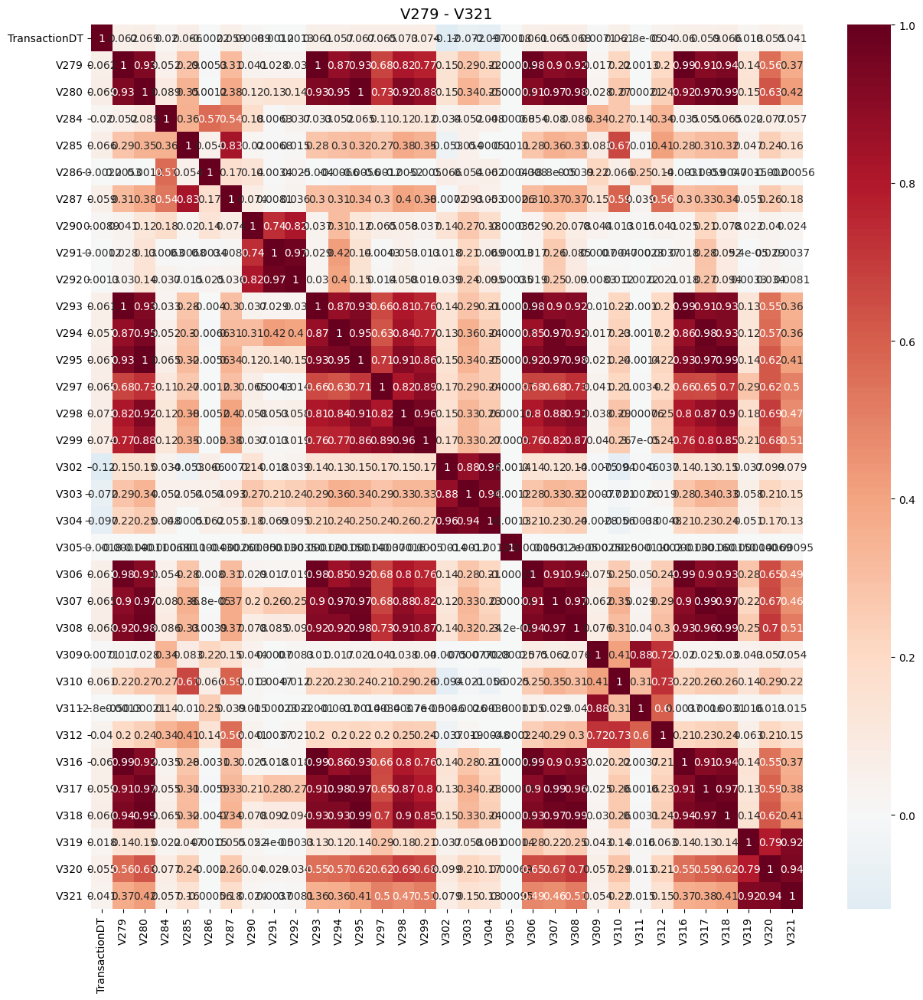

In [ ]:
Vs = [x for x in nans_groups[12]]
make_corr(Vs)

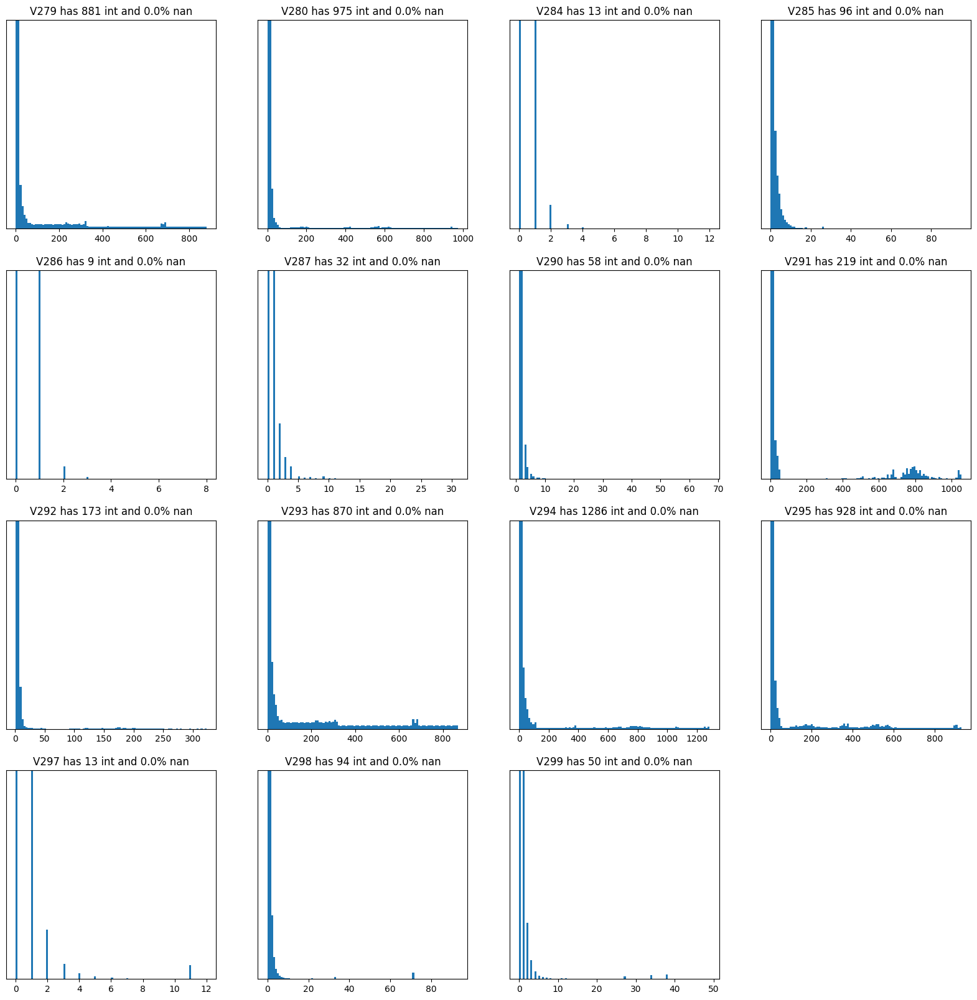

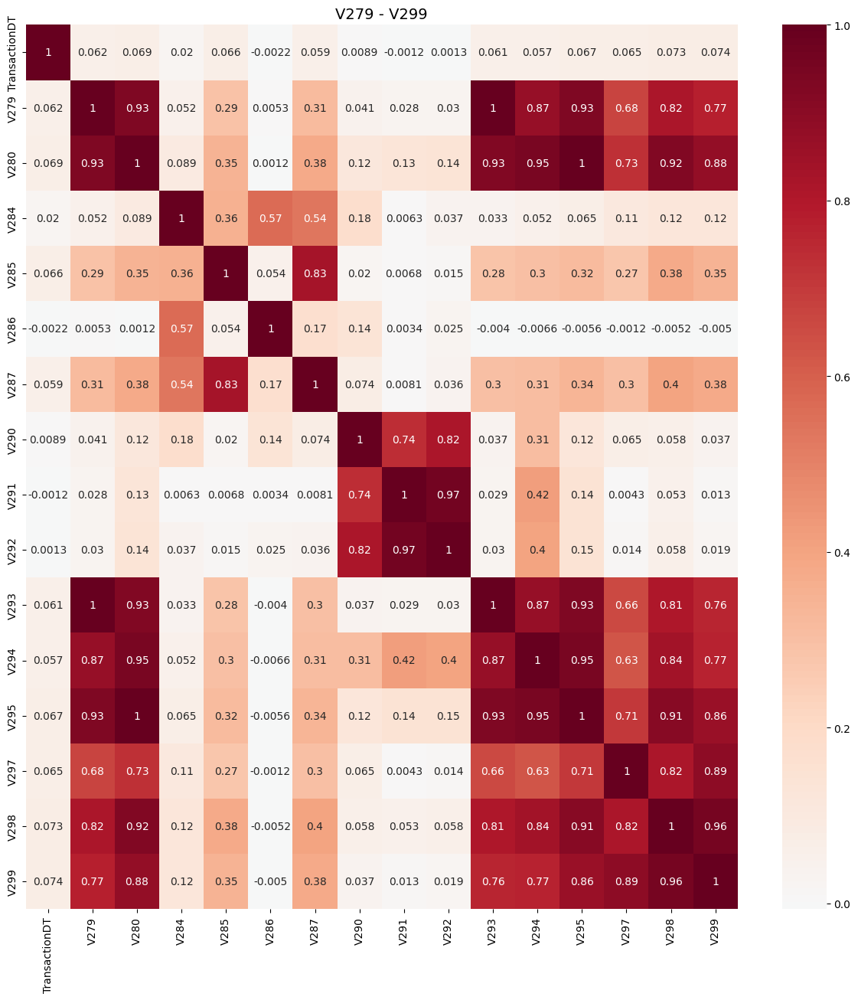

In [ ]:
Vs = [x for x in nans_groups[12] if int(x[1:])<302]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[279,280,293,294,295,298,299],[284],[285,287],[286],[290,291,292],[297]]
reduce_group(grps)

Use these [294, 284, 285, 286, 291, 297]


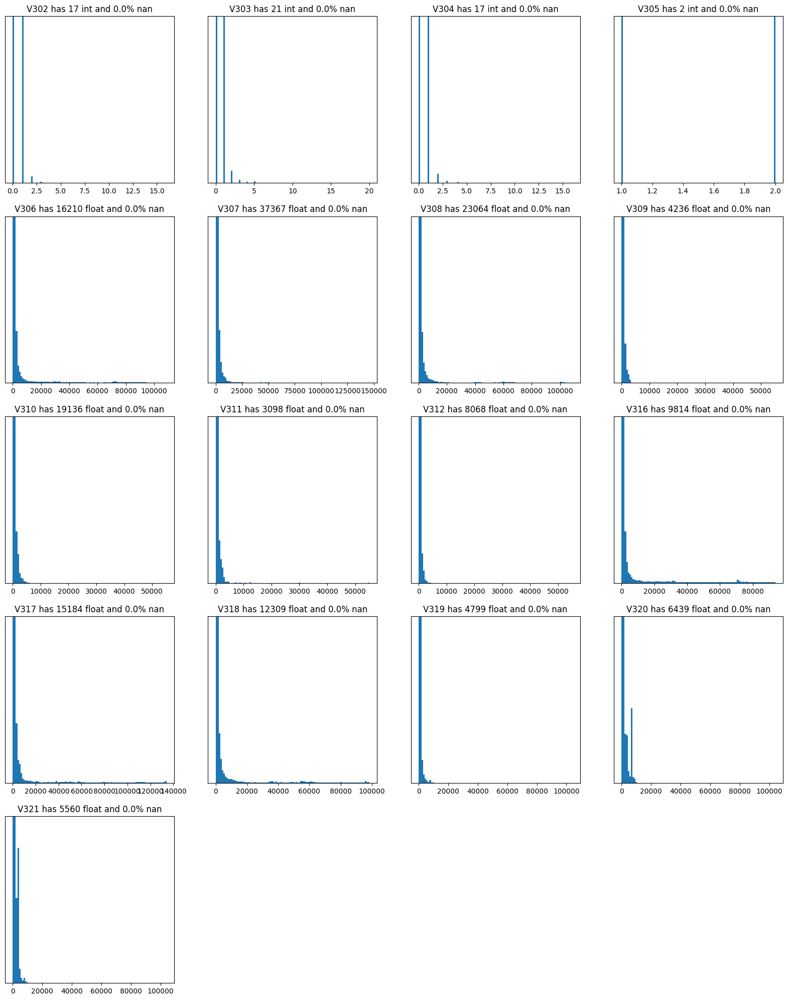

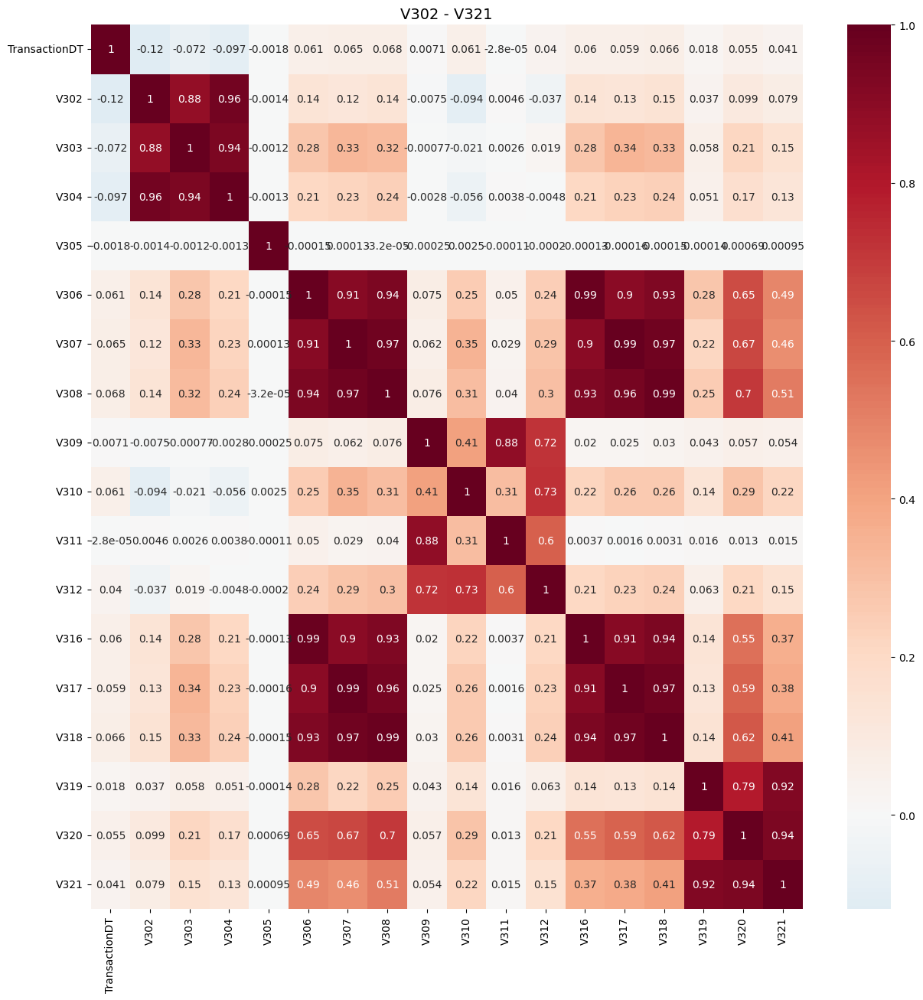

In [ ]:
Vs = [x for x in nans_groups[12] if int(x[1:])>299]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[302,303,304],[305],[306,307,308,316,317,318],[309,311],[310,312],[319,320,321]]
reduce_group(grps)

Use these [303, 305, 307, 309, 310, 320]


# V281-V315

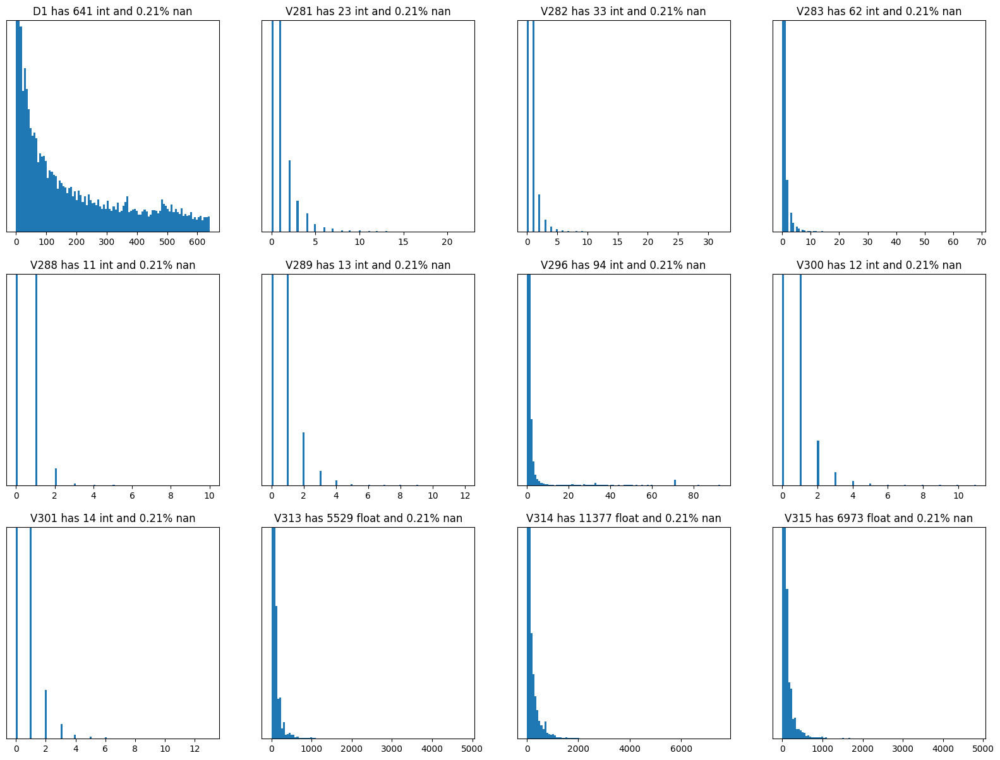

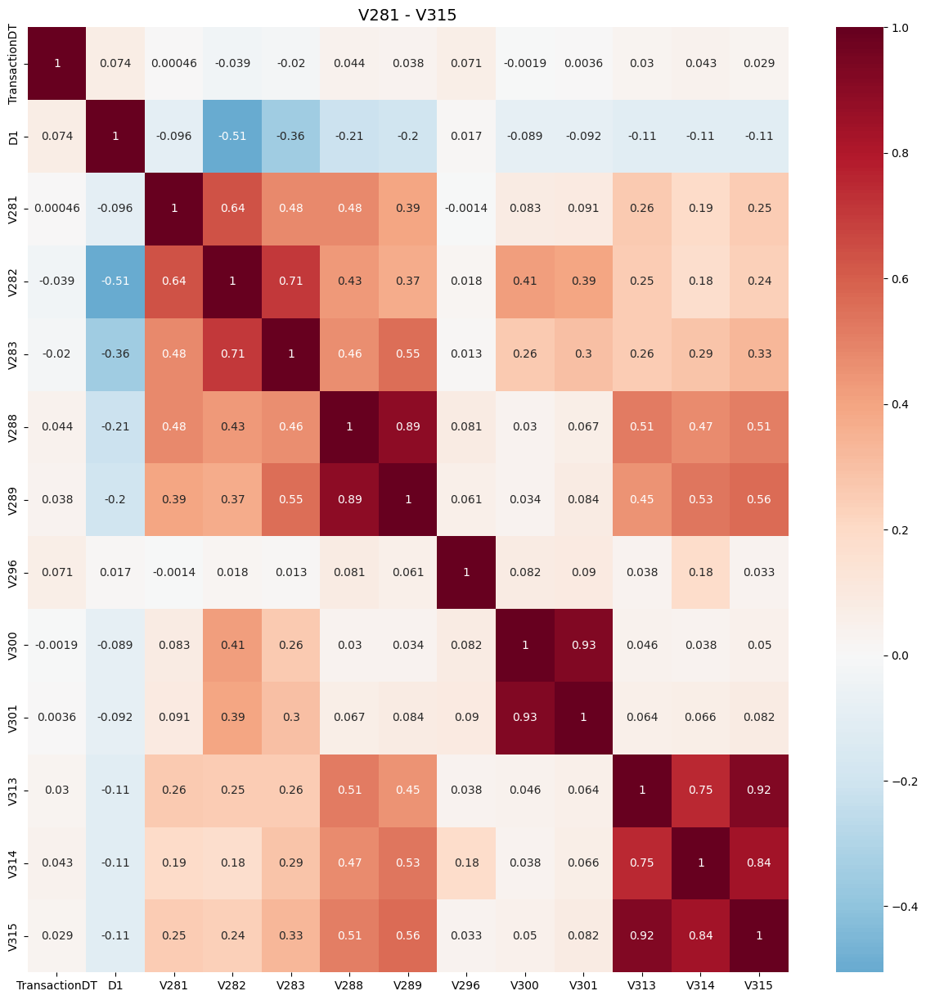

In [ ]:
Vs = nans_groups[1269]
make_plots(Vs)
Vtitle = 'V281 - V315'
make_corr(Vs,Vtitle)

In [ ]:
grps = [[281],[282,283],[288,289],[296],[300,301],[313,314,315]]
reduce_group(grps)

Use these [281, 283, 289, 296, 301, 314]


# V322-V339

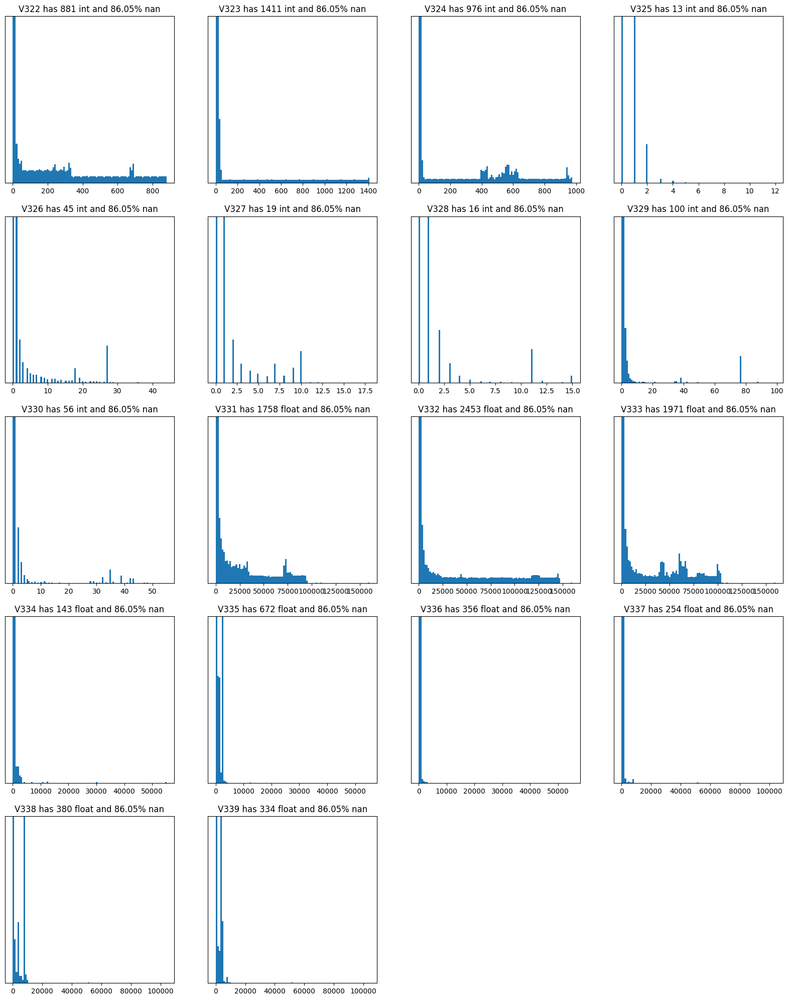

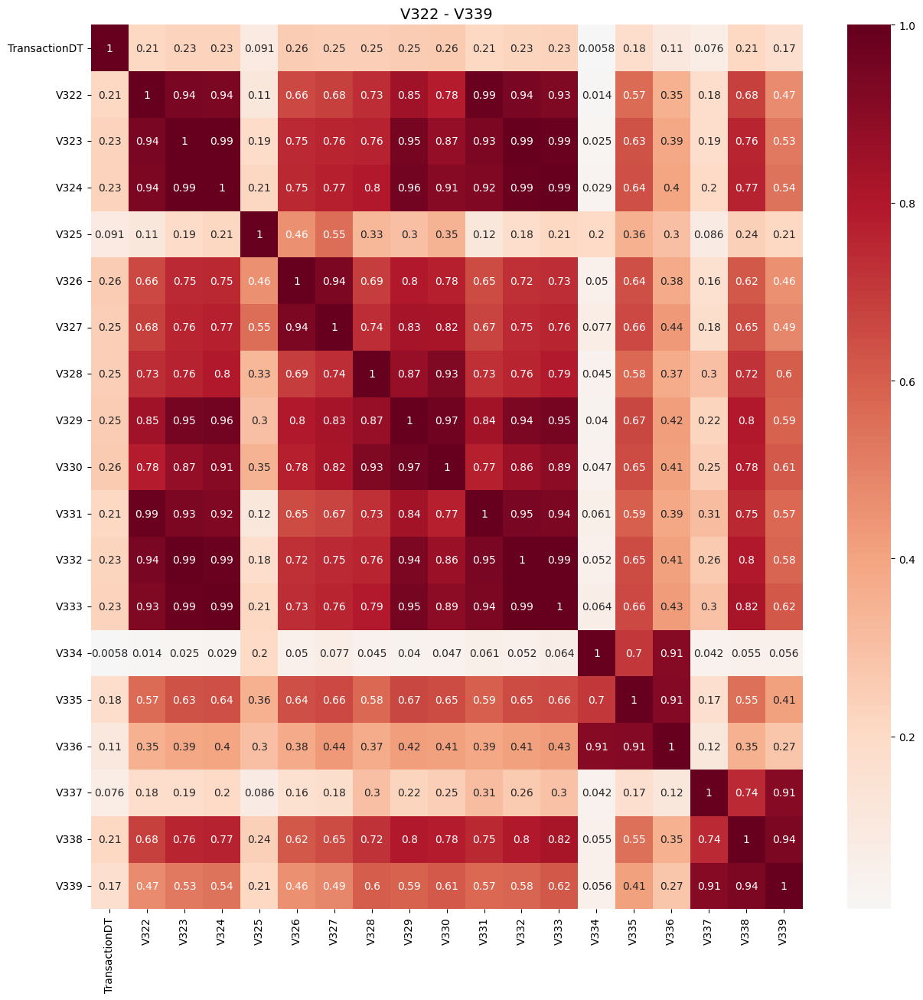

In [ ]:
Vs = nans_groups[508189]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[322,323,324,326,327,328,329,330,331,332,333],[325],[334,335,336],[337,338,339]]
reduce_group(grps)

Use these [332, 325, 335, 338]


# V Reduced

In [4]:
V = [1, 3, 4, 6, 8, 11]
V += [13, 14, 17, 20, 23, 26, 27, 30]
V += [36, 37, 40, 41, 44, 47, 48]
V += [54, 56, 59, 62, 65, 67, 68, 70]
V += [76, 78, 80, 82, 86, 88, 89, 91]
V += [96, 98, 99, 104]
V += [107, 108, 111, 115, 117, 120, 121, 123]
V += [124, 127, 129, 130, 136]
V += [138, 139, 142, 147, 156, 162]
V += [165, 160, 166]
V += [178, 176, 173, 182]
V += [187, 203, 205, 207, 215]
V += [169, 171, 175, 180, 185, 188, 198, 210, 209]
V += [218, 223, 224, 226, 228, 229, 235]
V += [240, 258, 257, 253, 252, 260, 261]
V += [264, 266, 267, 274, 277]
V += [220, 221, 234, 238, 250, 271]
V += [294, 284, 285, 286, 291, 297]
V += [303, 305, 307, 309, 310, 320]
V += [281, 283, 289, 296, 301, 313, 314]
V += [332, 325, 335, 338]

In [5]:
print('Reduced set has', len(V), 'columns')

Reduced set has 129 columns


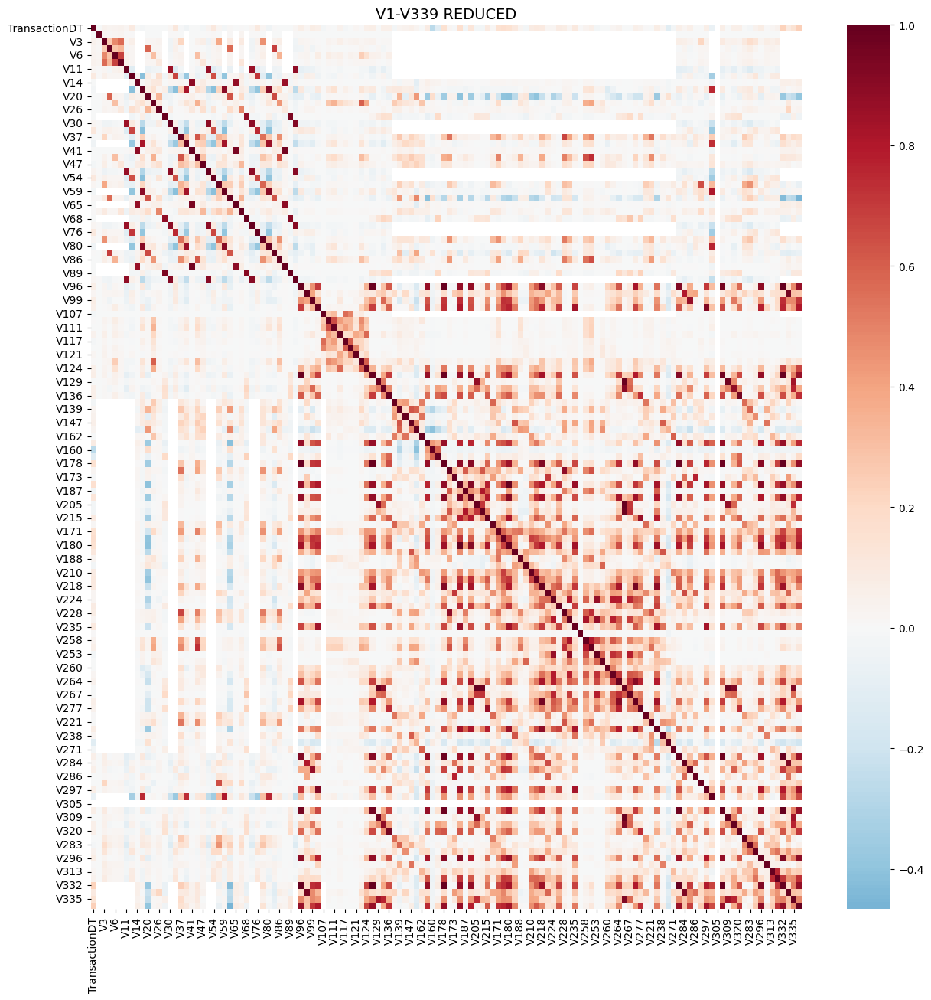

In [6]:
cols = ['TransactionDT'] + ['V' + str(x).replace('V', '') for x in V]
train2 = train[cols].sample(frac=0.2)
plt.figure(figsize=(15,15))
sns.heatmap(train2[cols].corr(), cmap='RdBu_r', annot=False, center=0.0)
plt.title('V1-V339 REDUCED',fontsize=14)
plt.show()

In [16]:
train2.head()

tmp = []

for col in train2.columns:
  tmp.append(col)

print(tmp)

['TransactionDT', 'V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V136', 'V138', 'V139', 'V142', 'V147', 'V156', 'V162', 'V165', 'V160', 'V166', 'V178', 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215', 'V169', 'V171', 'V175', 'V180', 'V185', 'V188', 'V198', 'V210', 'V209', 'V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240', 'V258', 'V257', 'V253', 'V252', 'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277', 'V220', 'V221', 'V234', 'V238', 'V250', 'V271', 'V294', 'V284', 'V285', 'V286', 'V291', 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320', 'V281', 'V283', 'V289', 'V296', 'V301', 'V313', 'V314', 'V332', 'V325', 'V335', 'V3

In [18]:
# Compute boolean mask of missing values for entire training set
nans_df = train2.isna()
nans_groups={}
i_cols = ['V'+str(i) for i in range(1,340)]

# Group columns by how many NaNs they have
for col in train2.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]
del nans_df; x=gc.collect()

# Print each NaN-count group and its columns
for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 0
['TransactionDT']
####### NAN count = 55789
['V1', 'V3', 'V4', 'V6', 'V8', 'V11']
####### NAN count = 15087
['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30']
####### NAN count = 33917
['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48']
####### NAN count = 15311
['V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70']
####### NAN count = 17779
['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91']
####### NAN count = 58
['V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V136']
####### NAN count = 101826
['V138', 'V139', 'V142', 'V147', 'V156', 'V162']
####### NAN count = 101824
['V165', 'V160', 'V166']
####### NAN count = 90360
['V178', 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215']
####### NAN count = 90322
['V169', 'V171', 'V175', 'V180', 'V185', 'V188', 'V198', 'V210', 'V209']
####### NAN count = 92170
['V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240

V1 - V11 (NaN count = 55789)


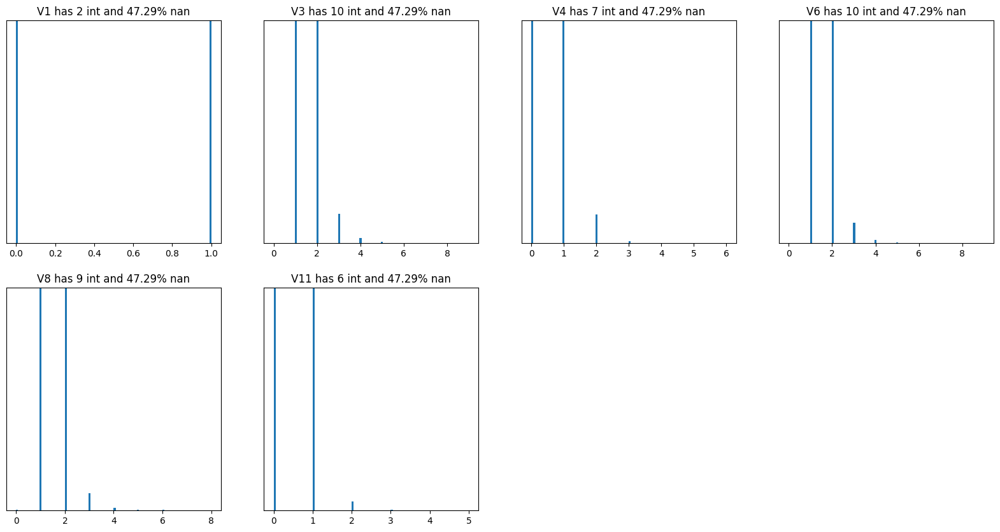

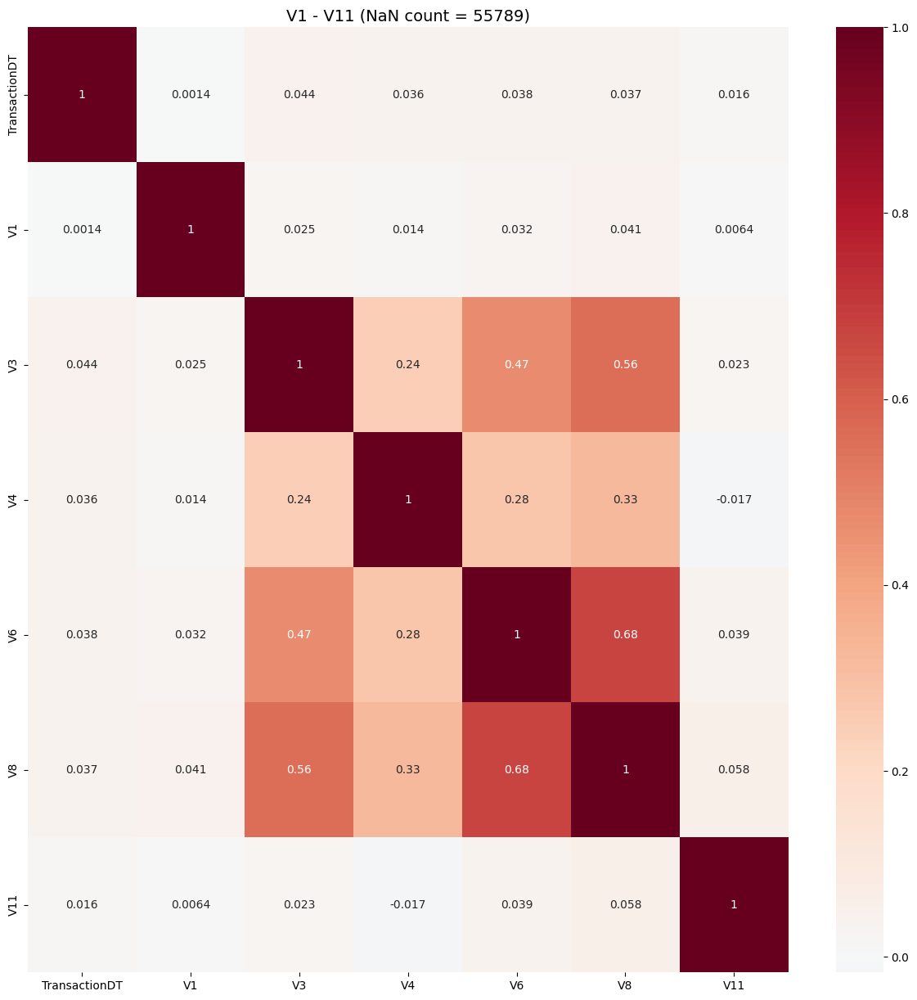

V13 - V30 (NaN count = 15087)


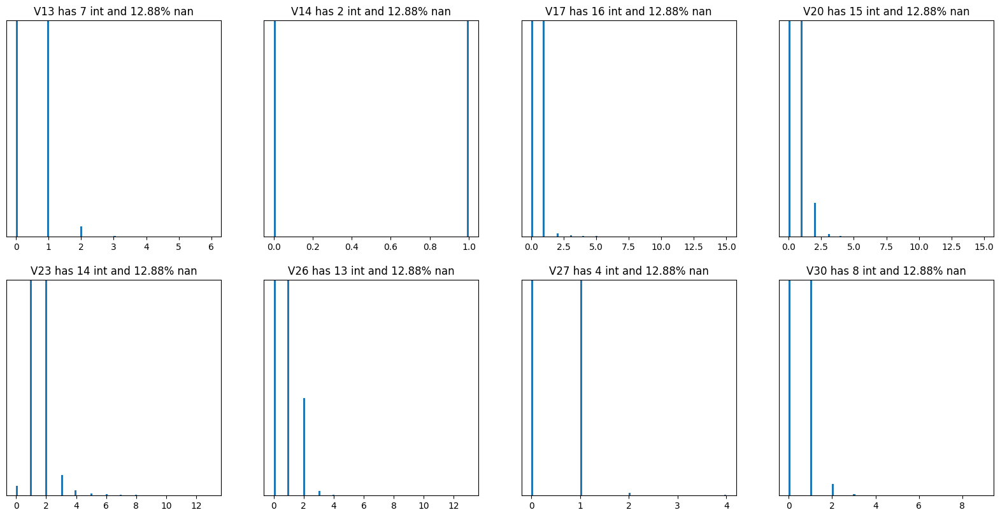

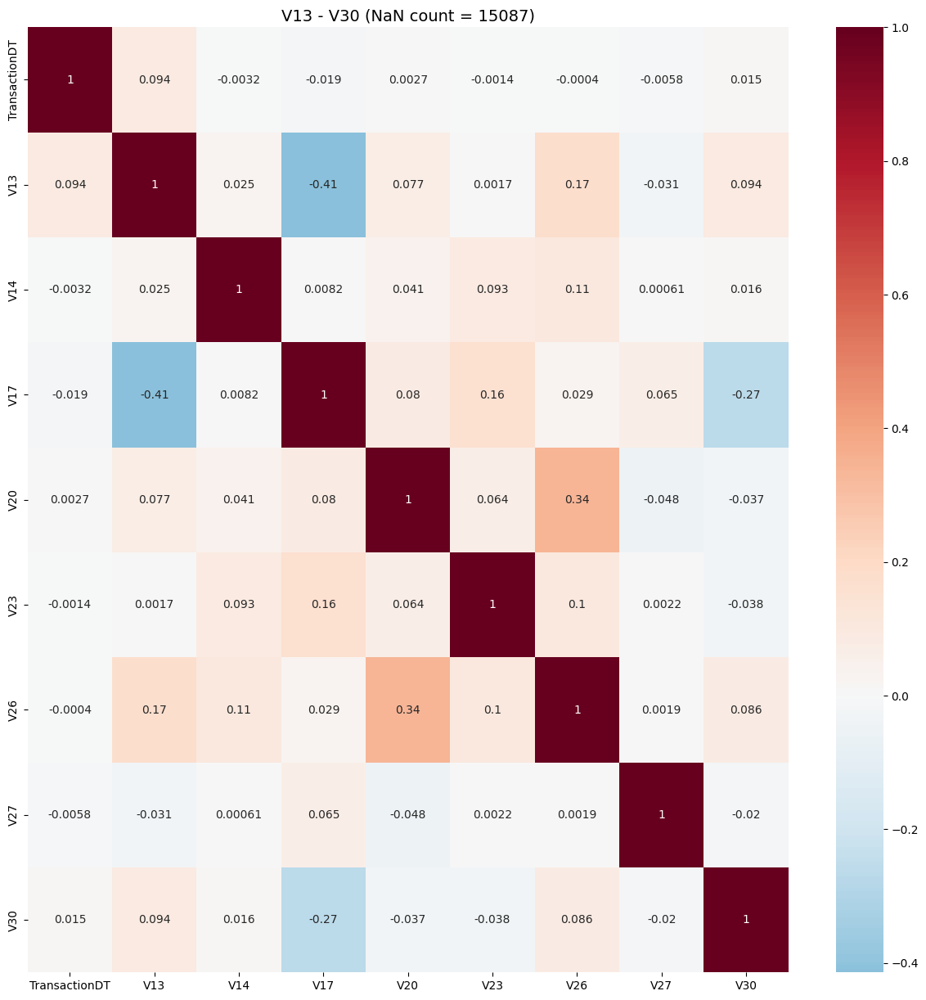

V36 - V48 (NaN count = 33917)


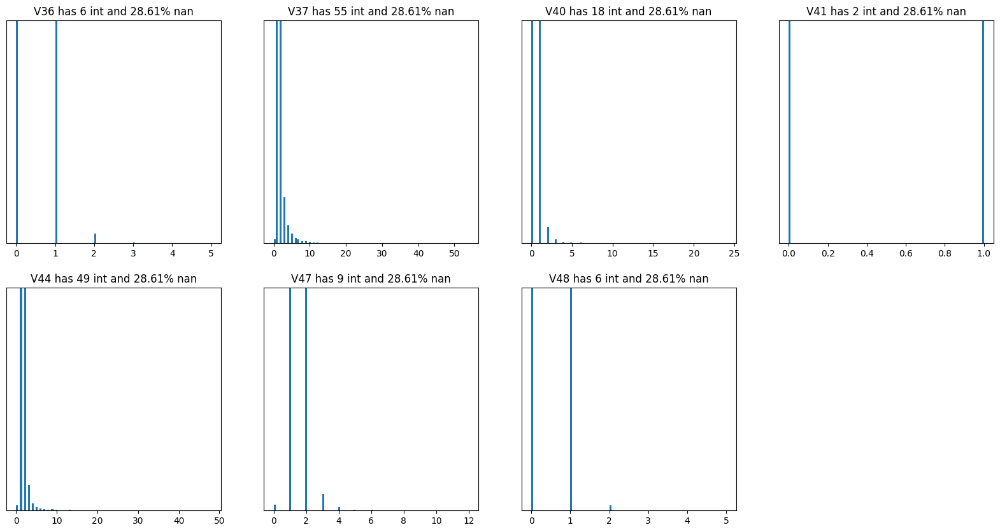

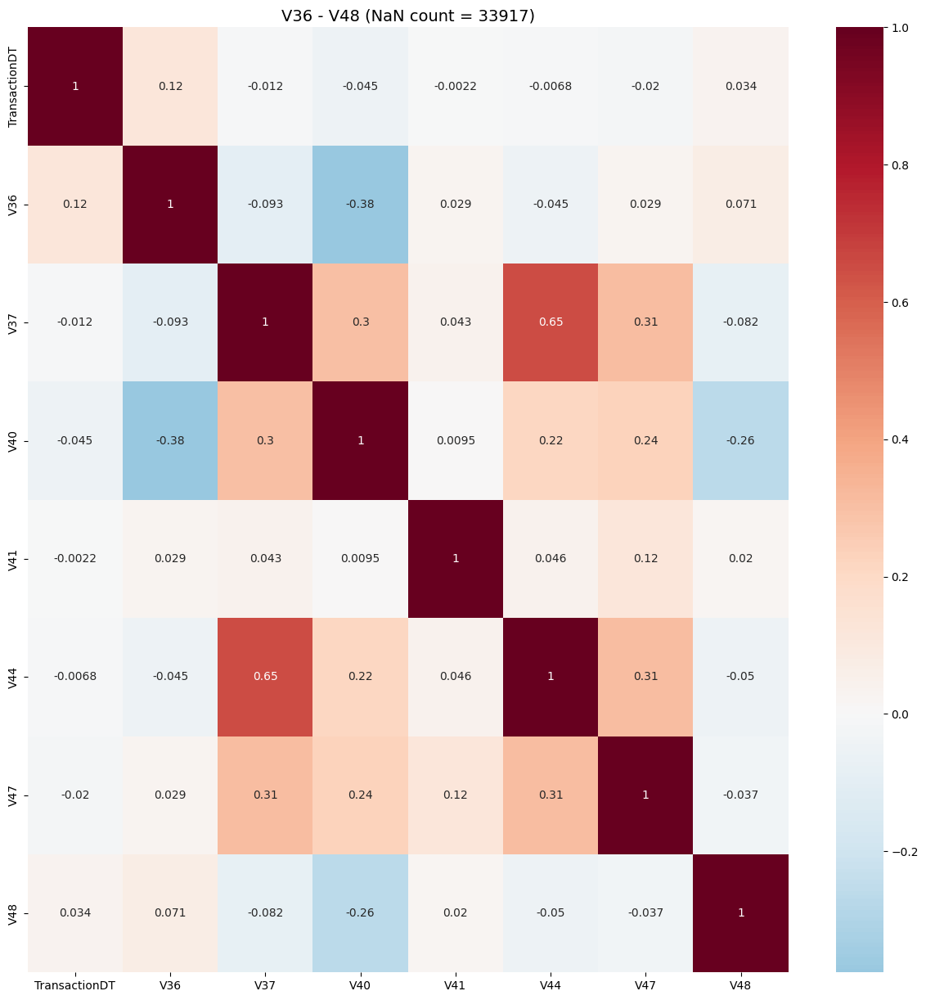

V54 - V70 (NaN count = 15311)


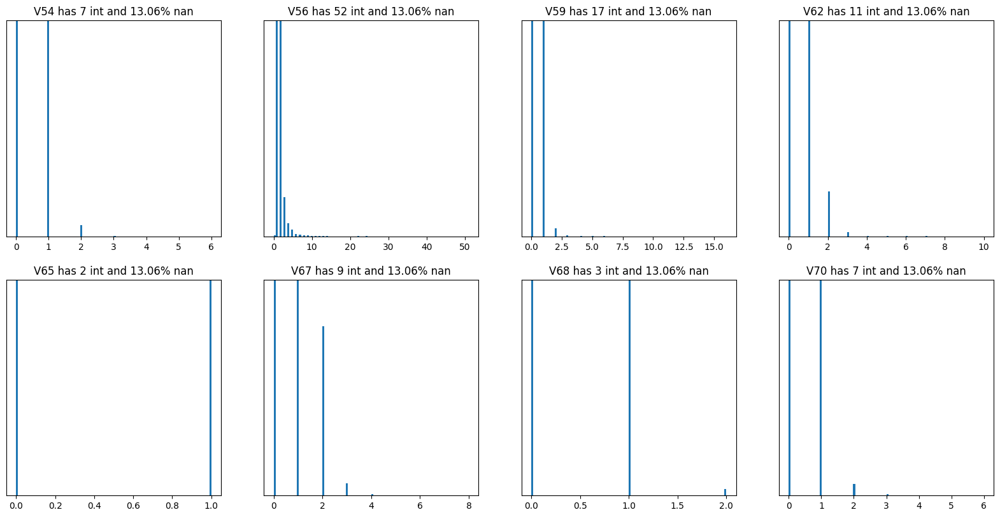

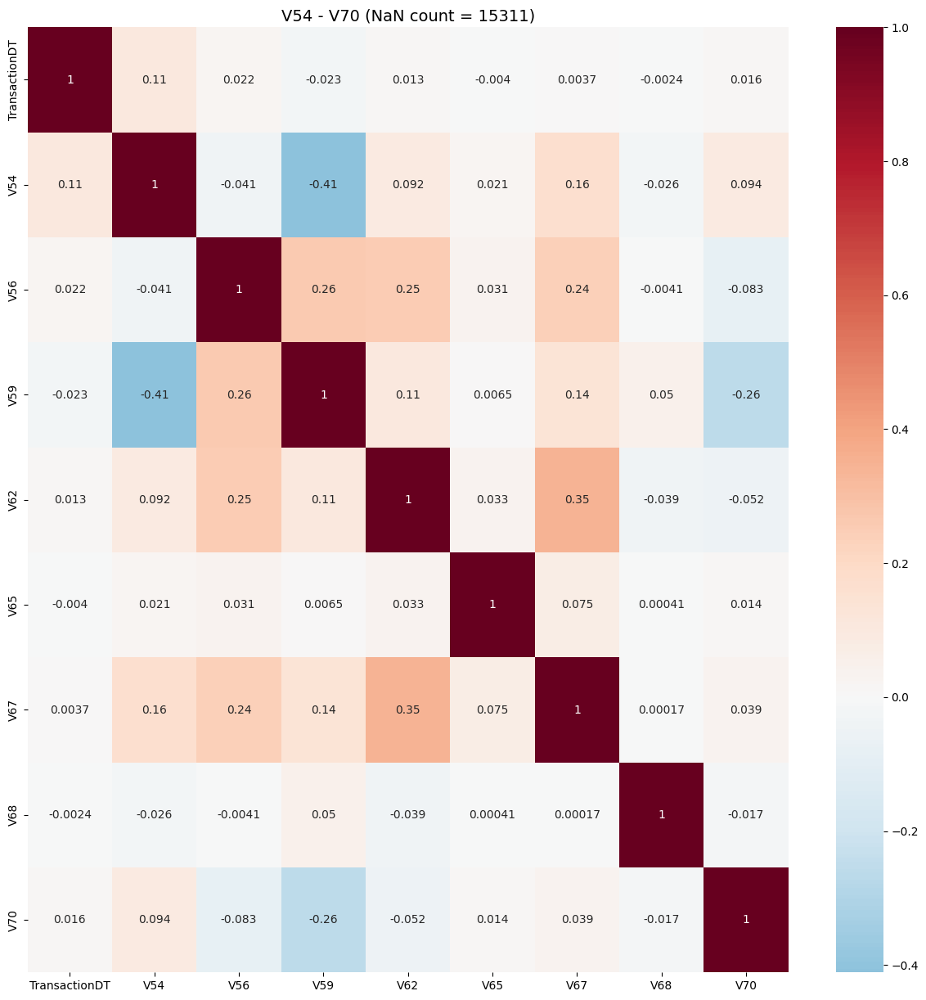

V76 - V91 (NaN count = 17779)


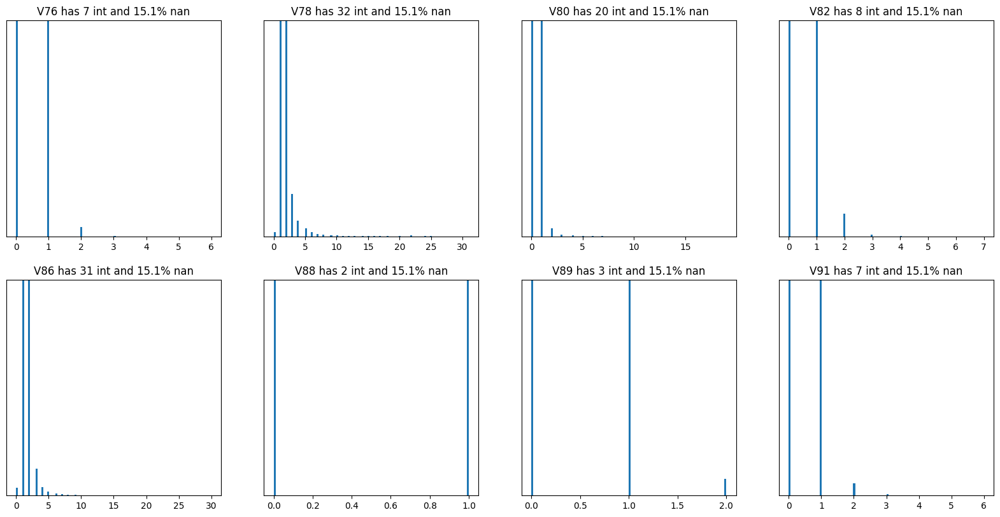

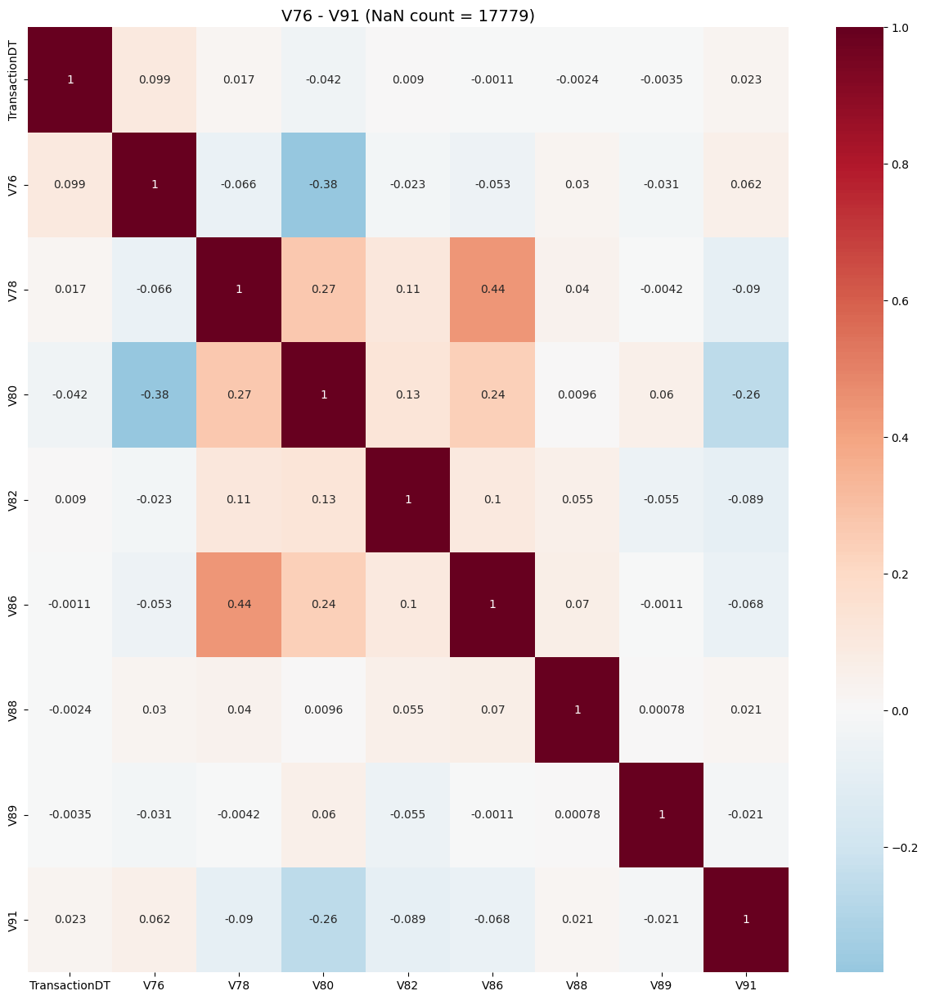

V96 - V136 (NaN count = 58)


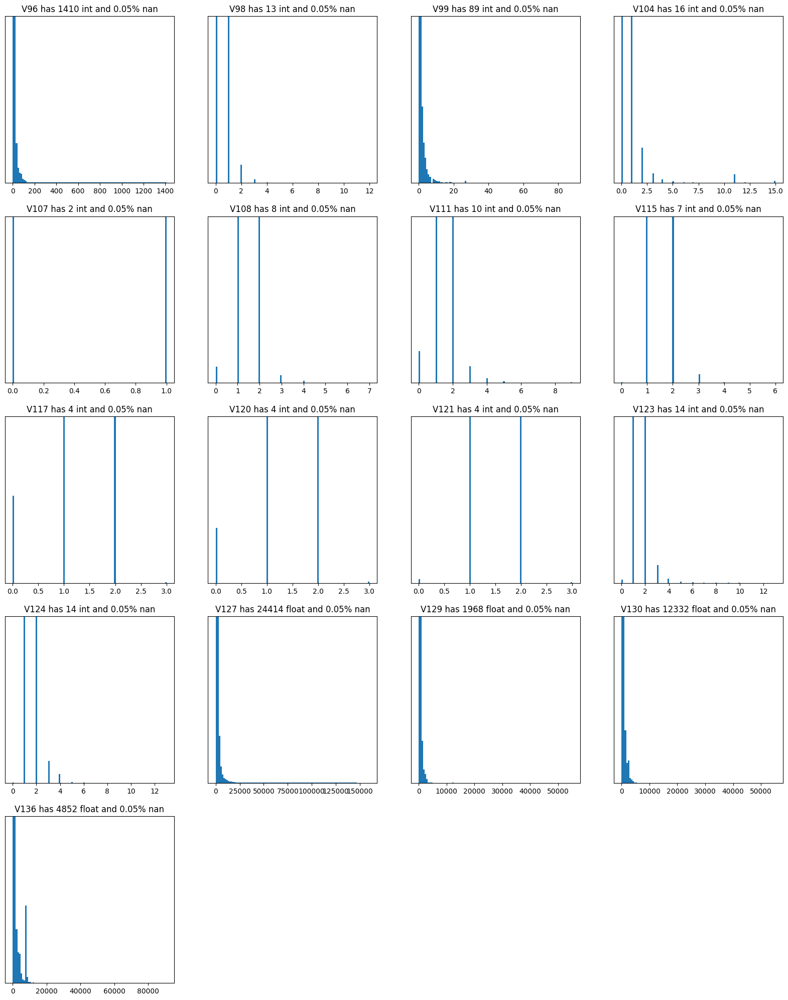

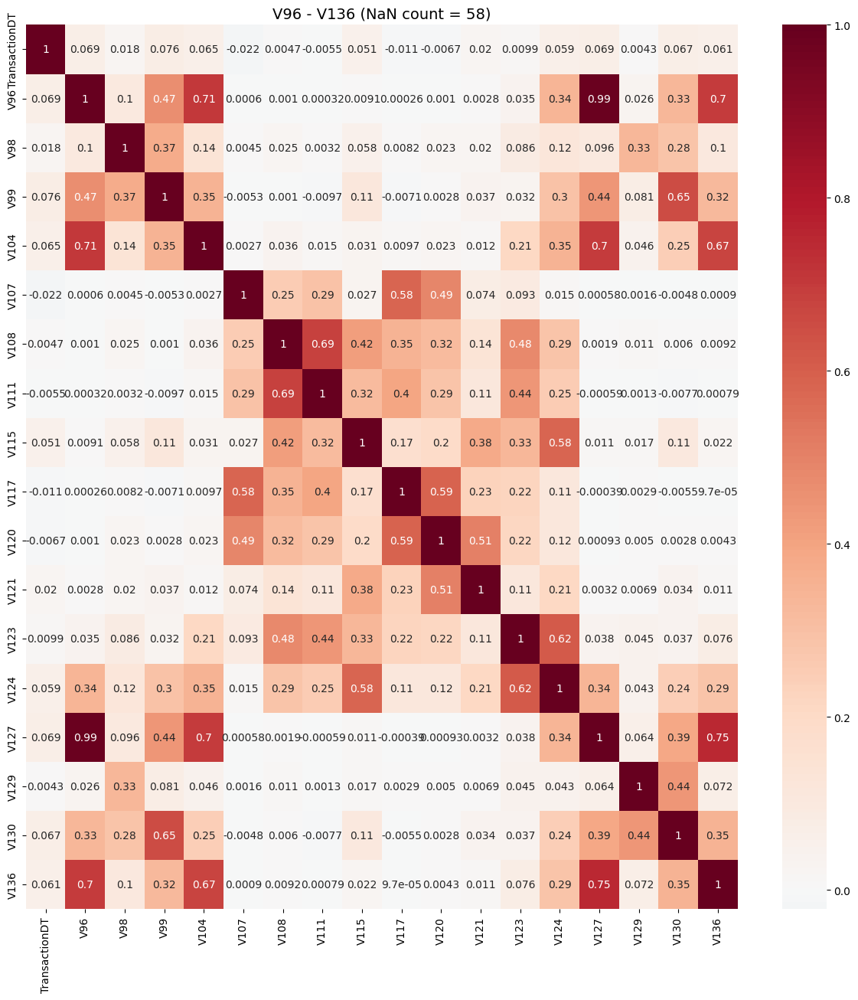

V138 - V162 (NaN count = 101826)


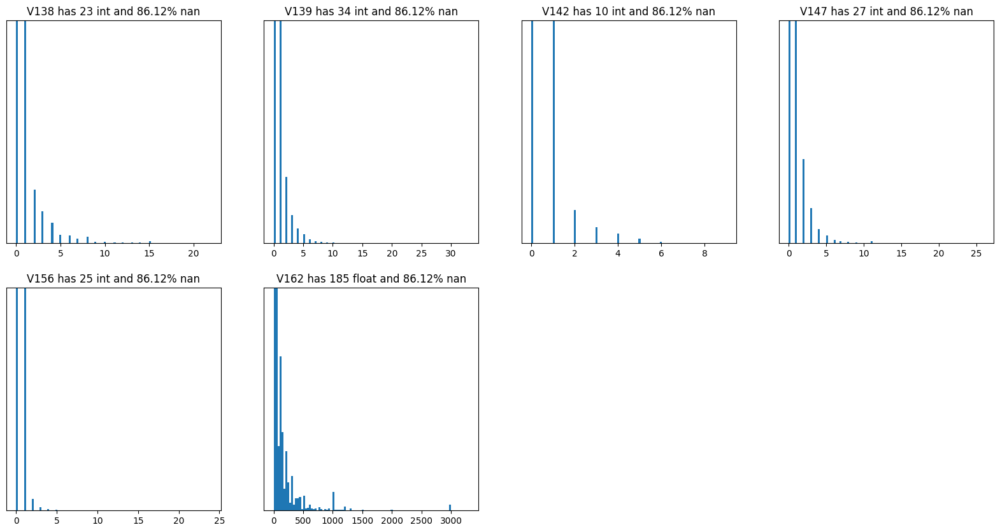

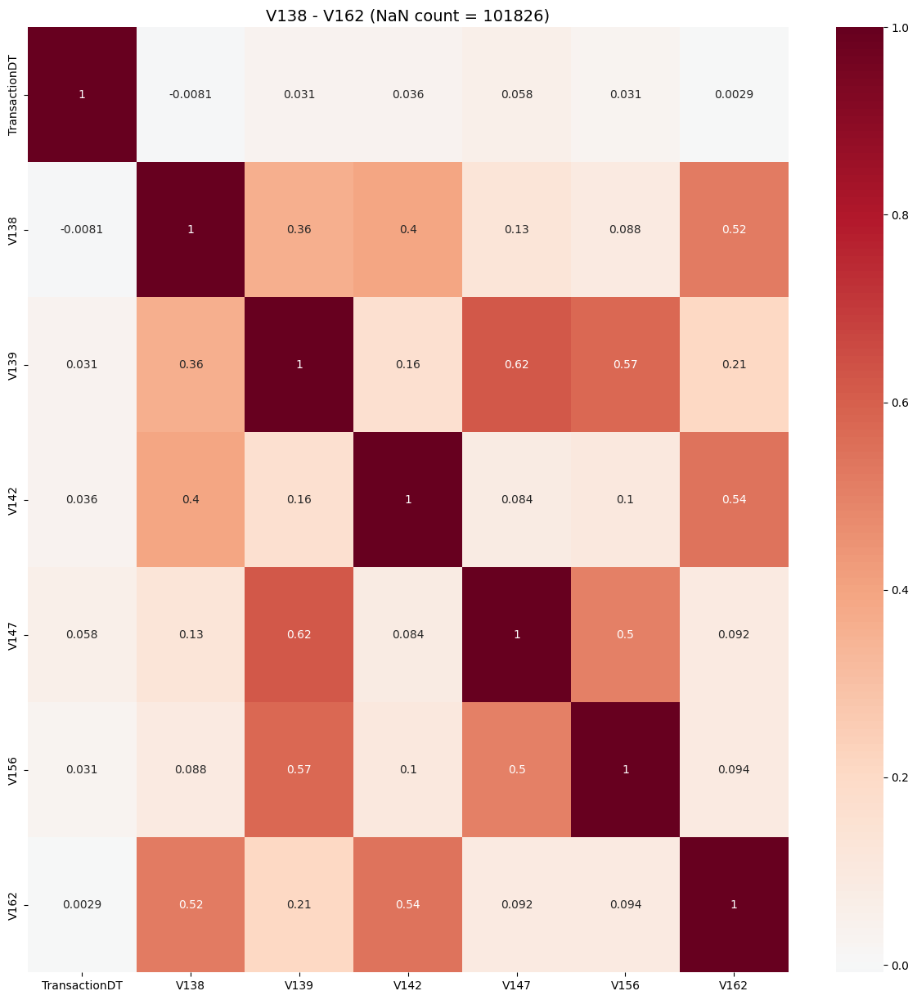

V165 - V166 (NaN count = 101824)


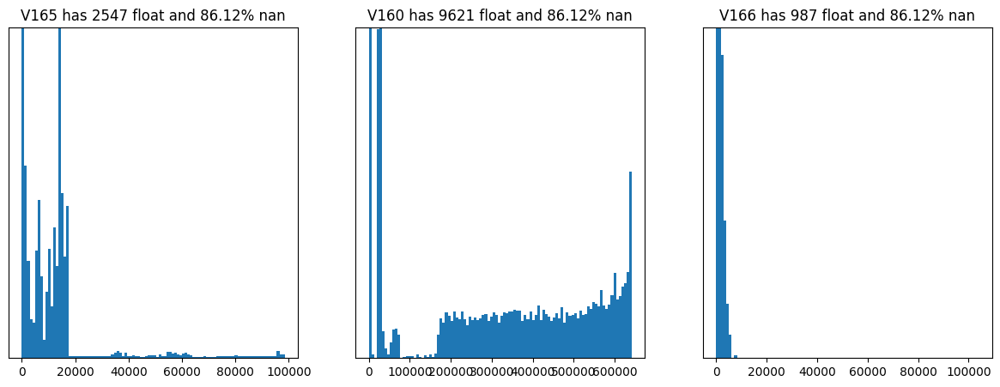

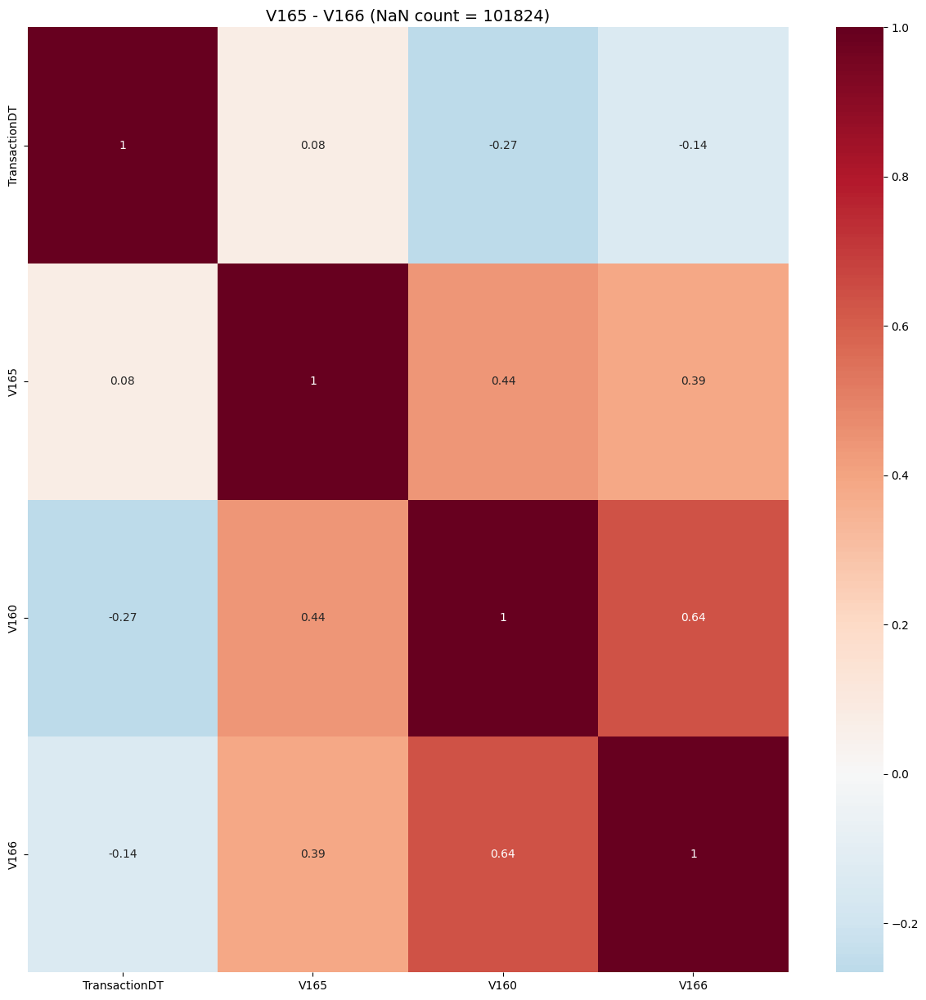

V178 - V215 (NaN count = 90360)


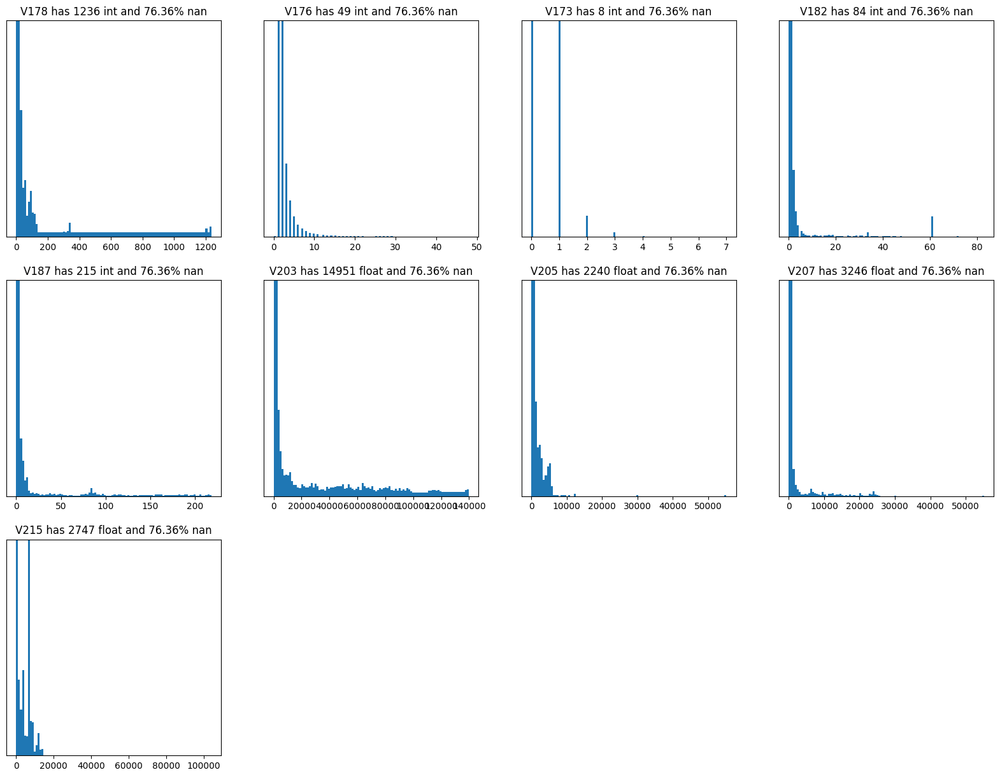

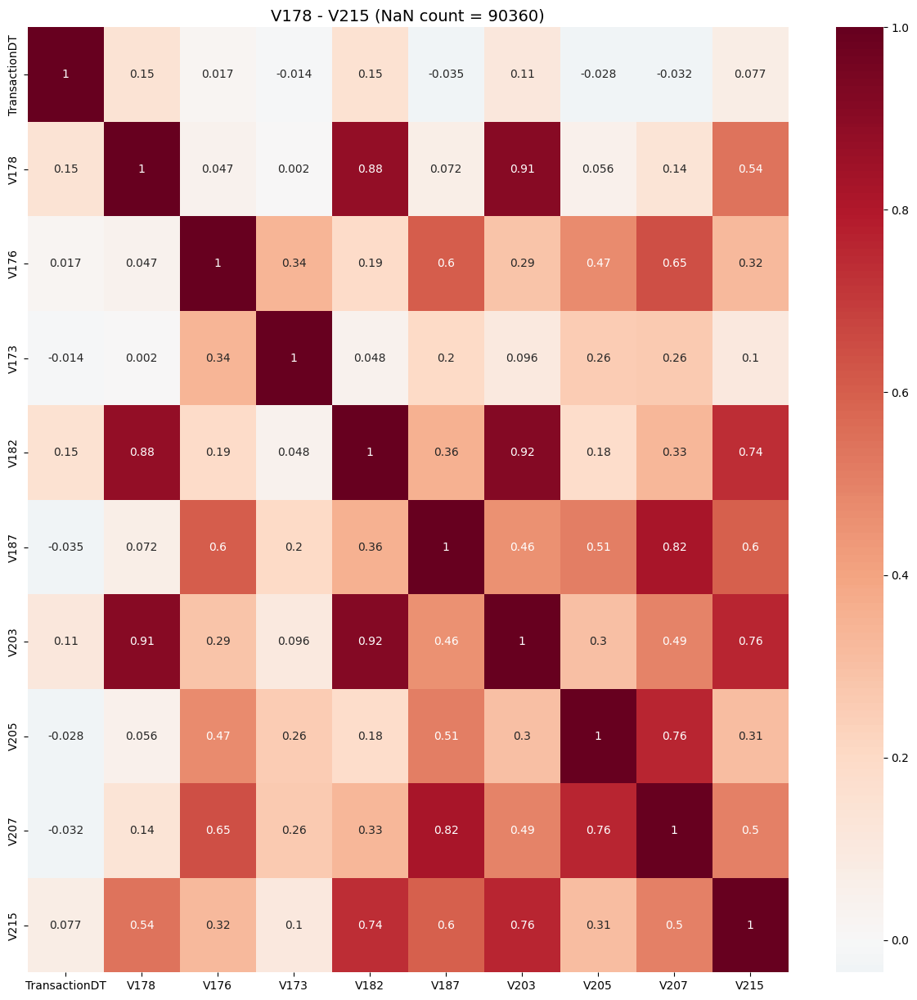

V169 - V209 (NaN count = 90322)


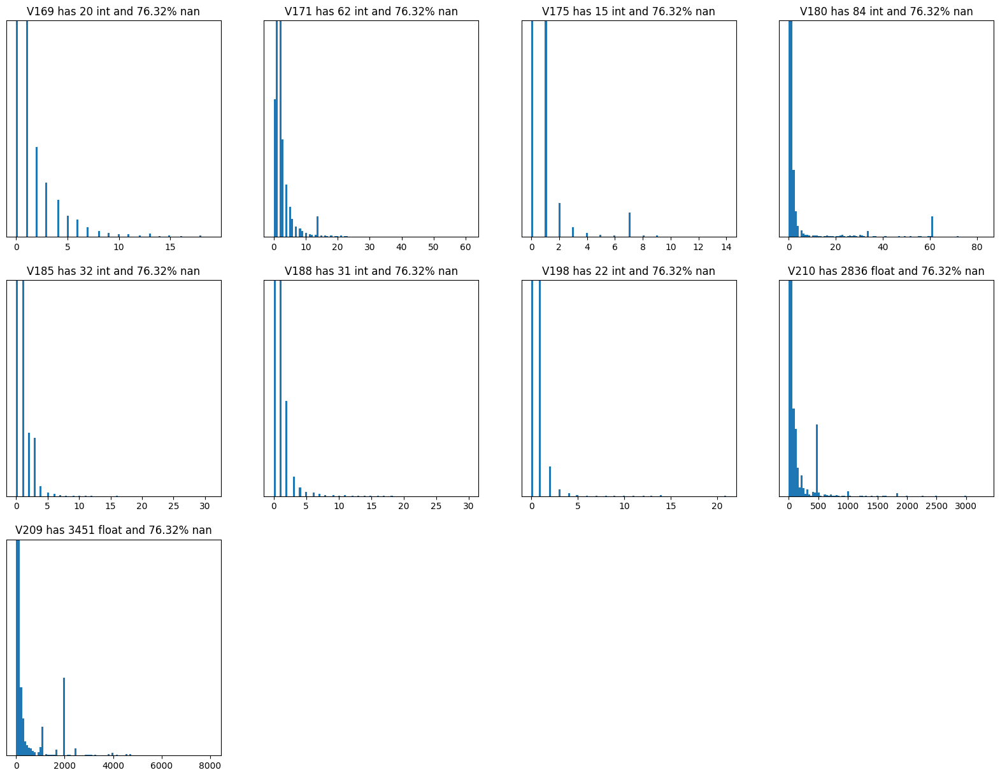

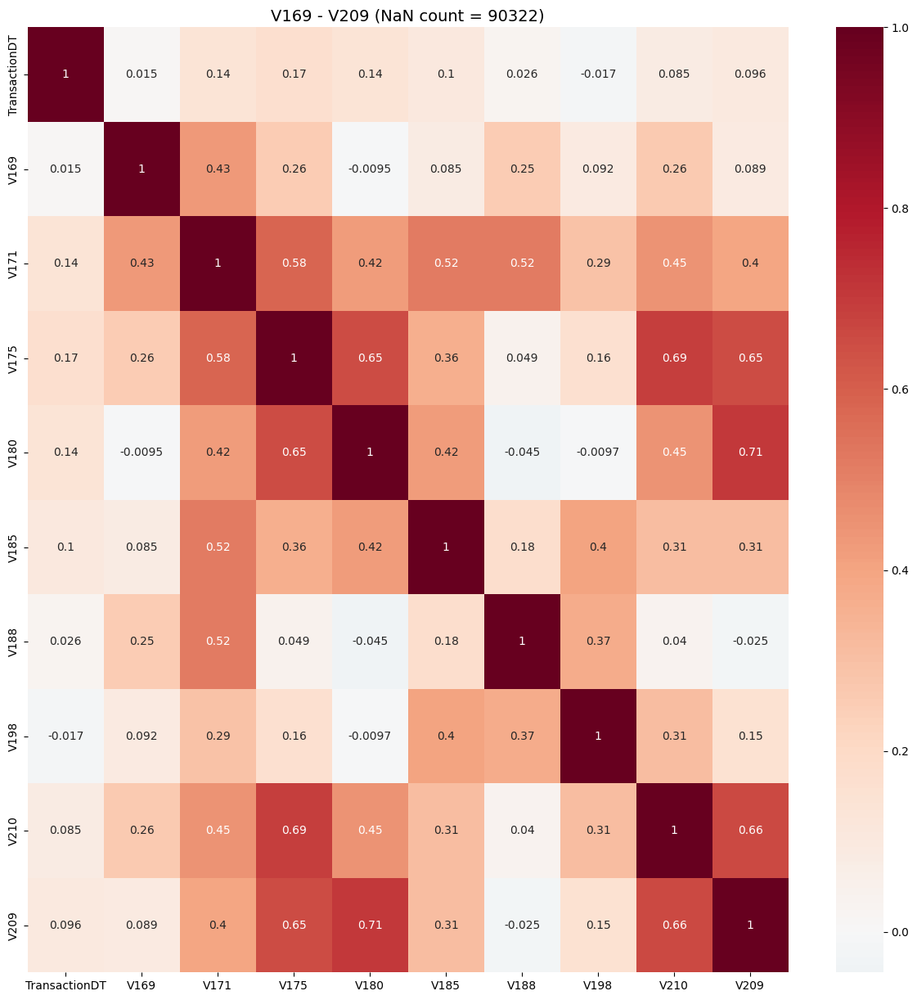

V218 - V277 (NaN count = 92170)


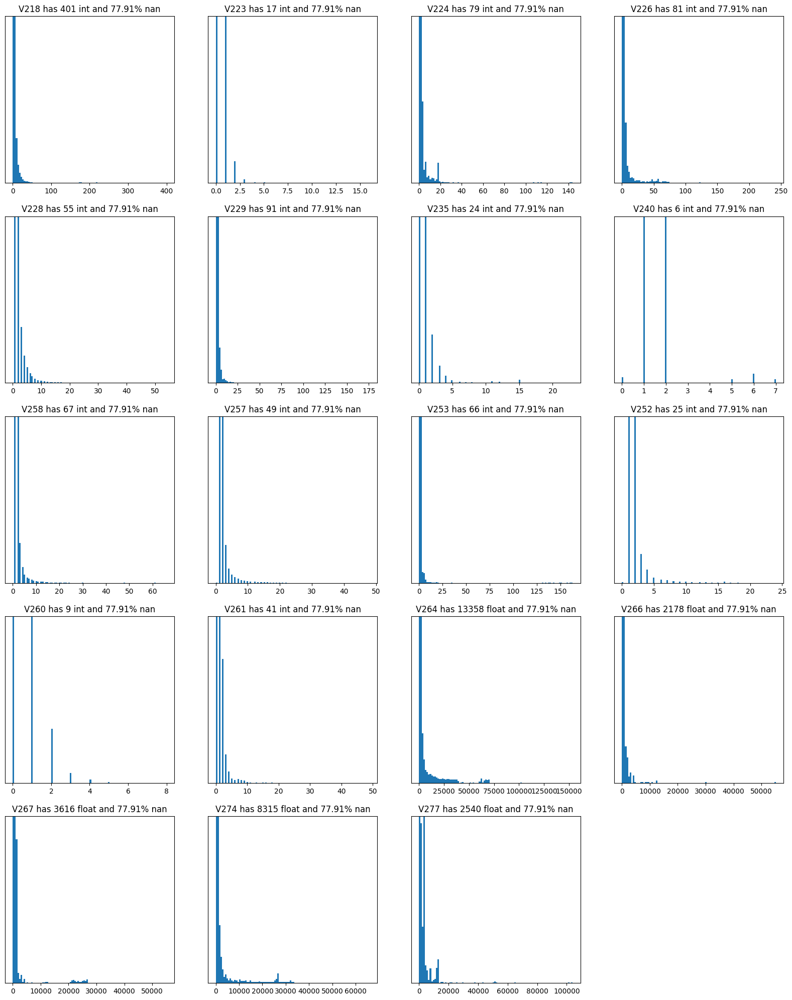

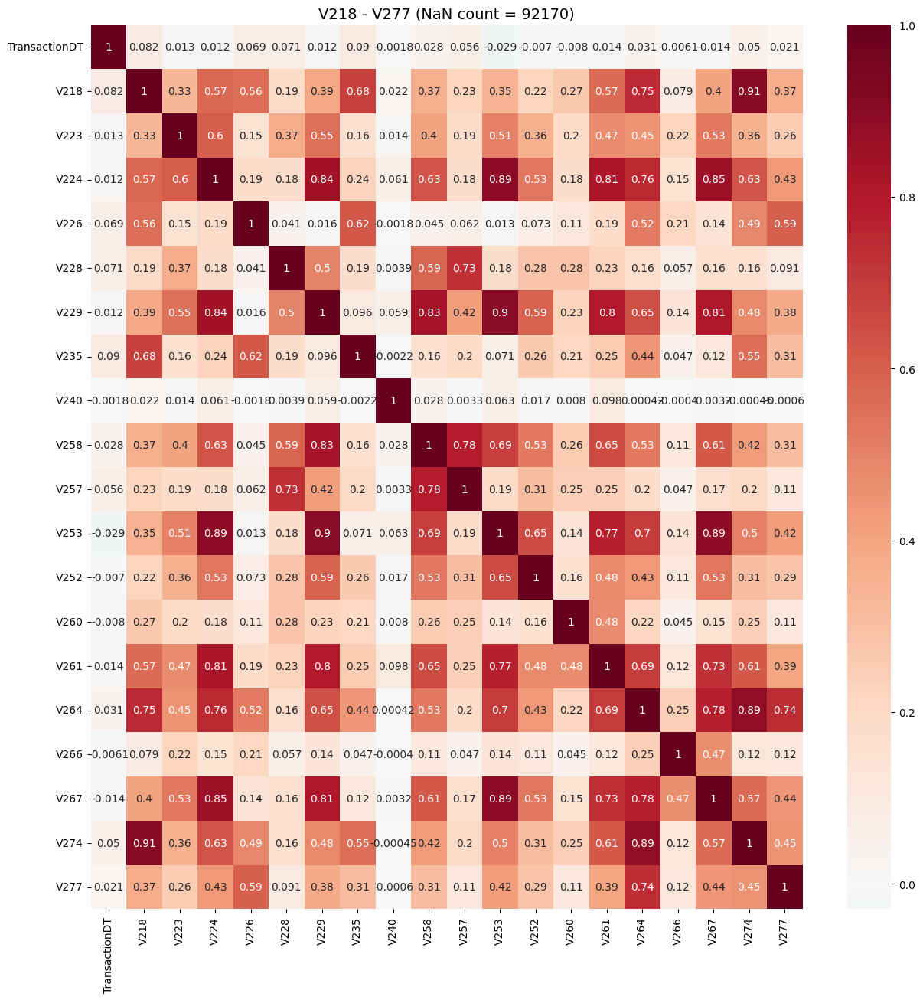

V220 - V271 (NaN count = 90009)


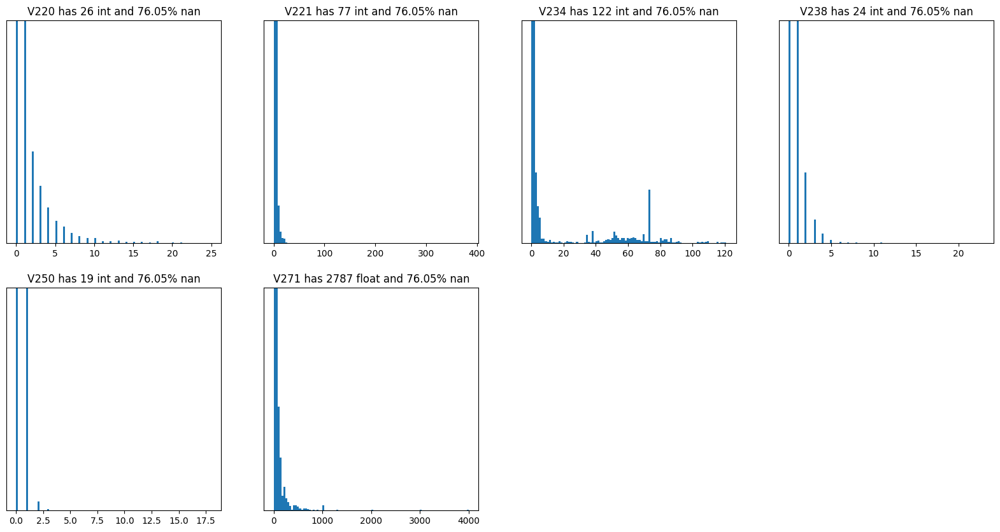

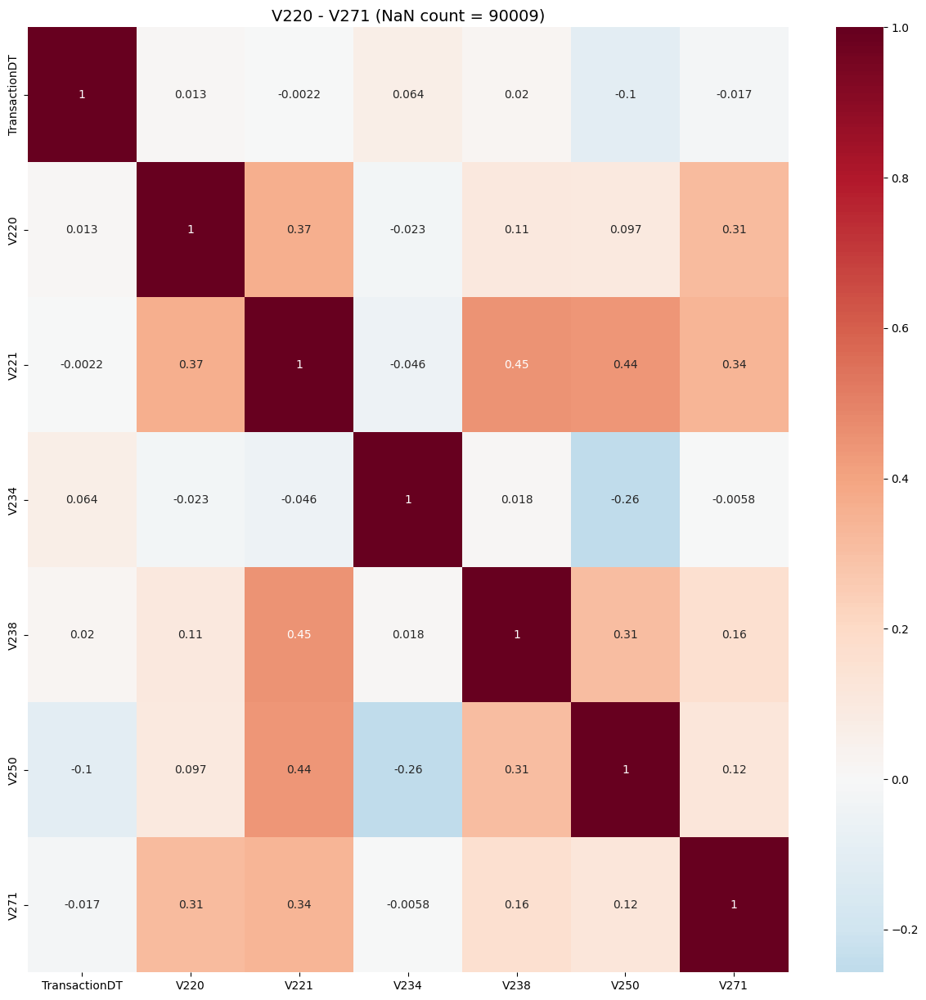

V294 - V320 (NaN count = 4)


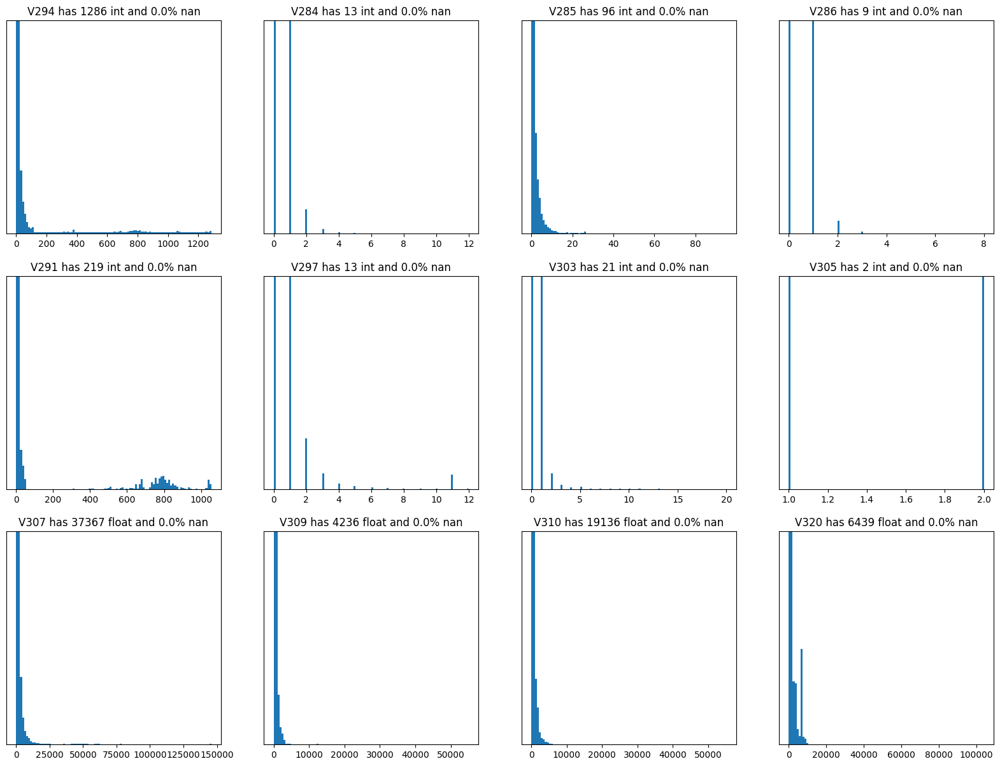

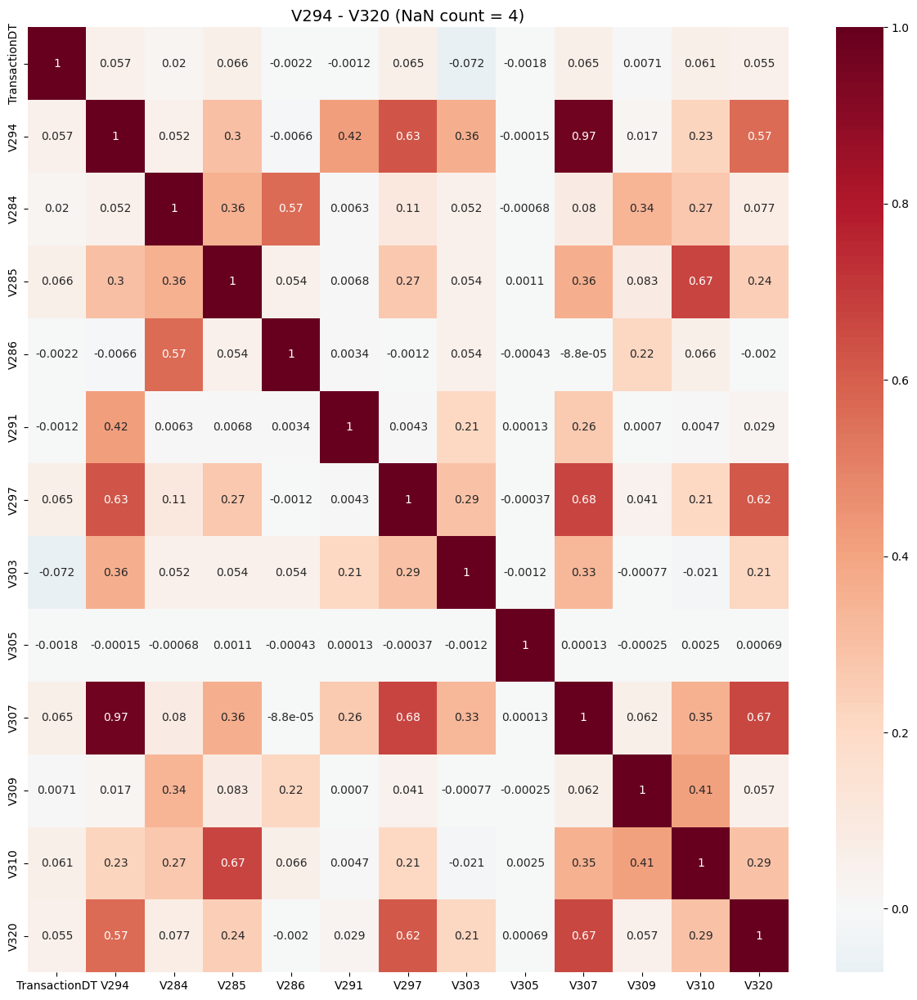

V281 - V314 (NaN count = 244)


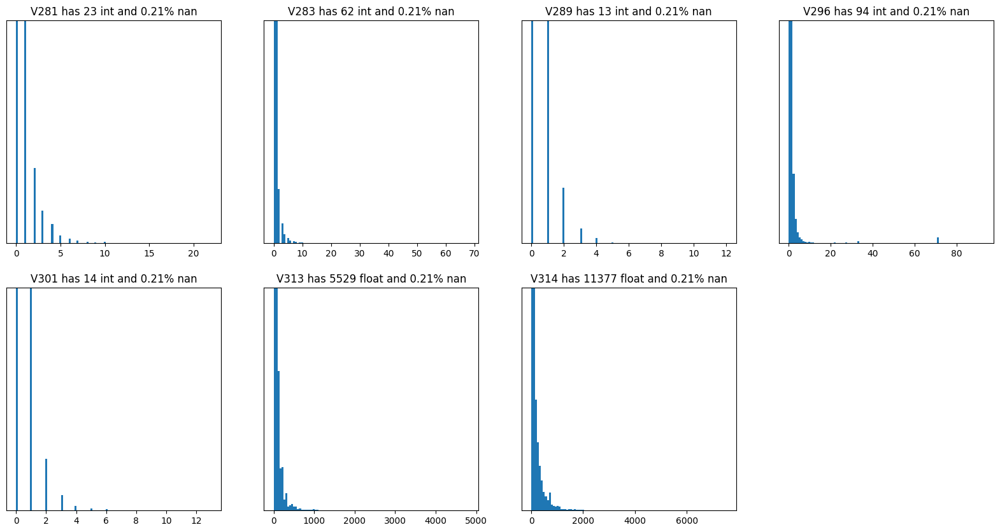

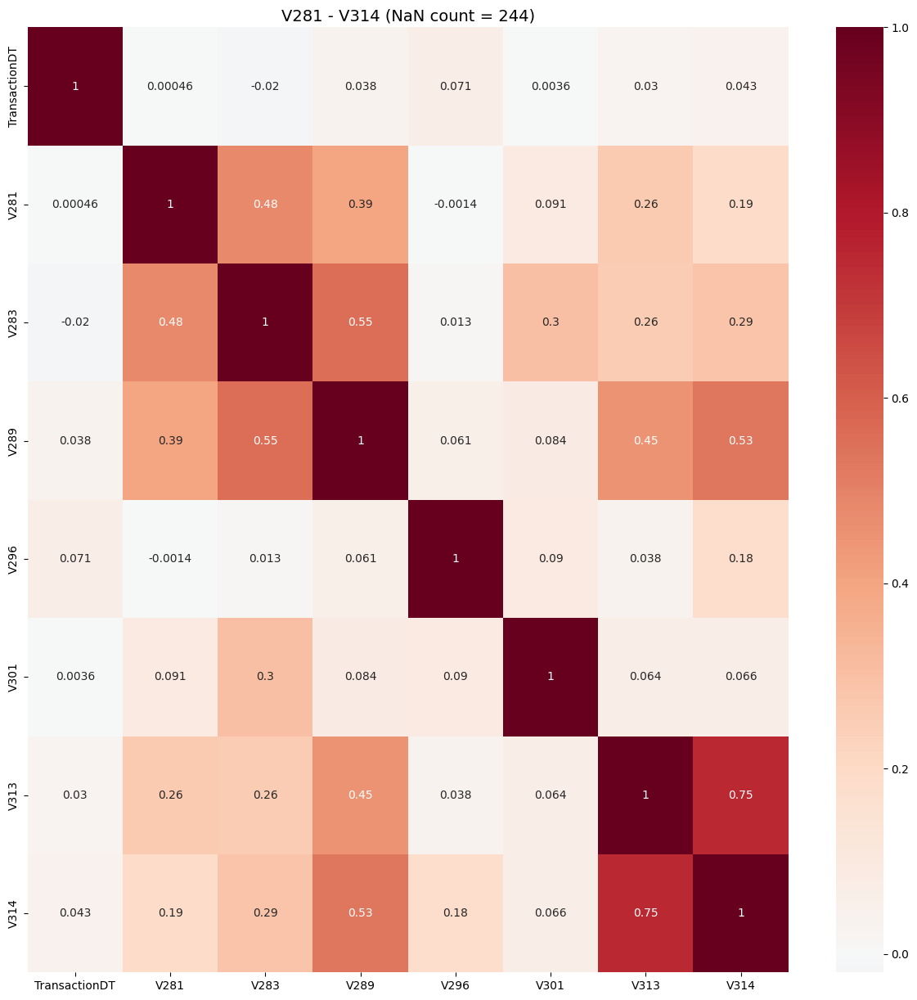

V332 - V338 (NaN count = 101750)


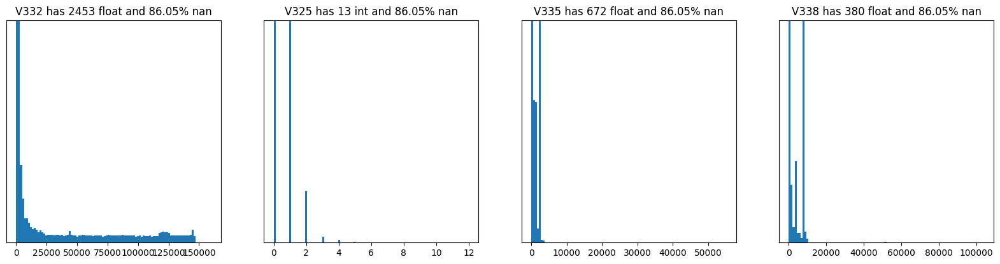

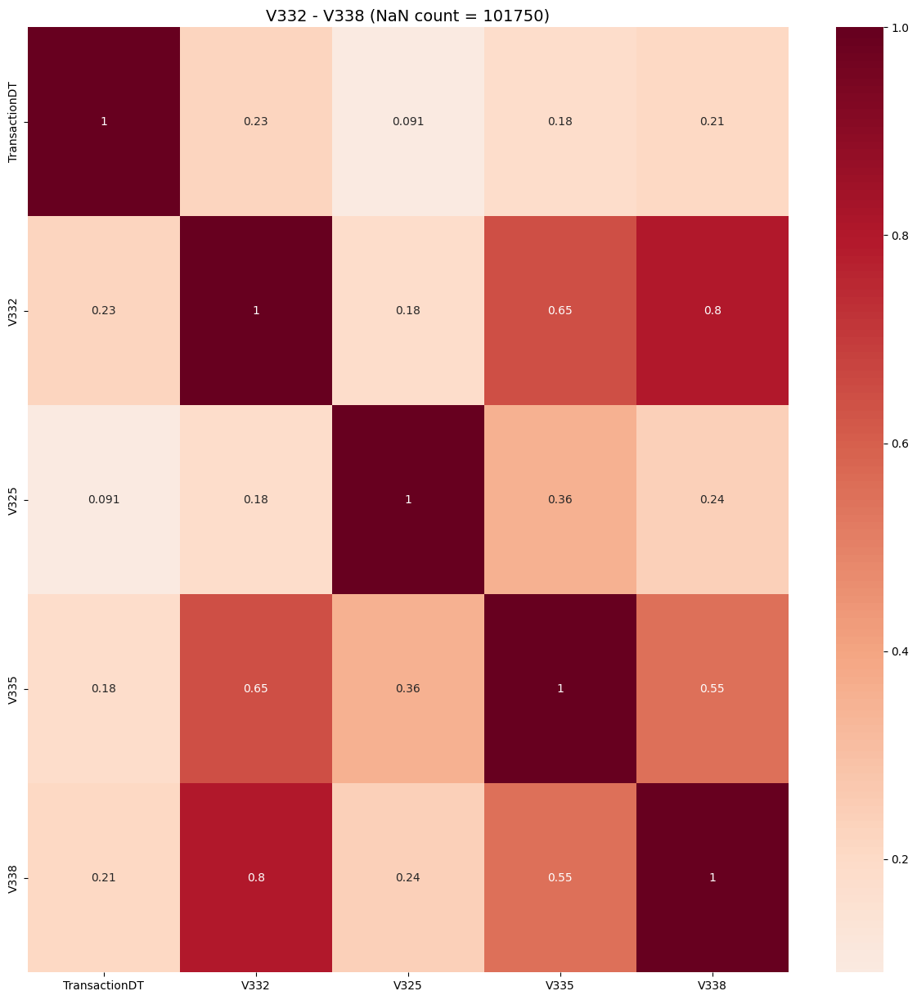

In [23]:
# All NaN-count groups found in train2 (excluding TransactionDT, which has no NaNs)
nan_groups_train2 = {
    55789: ['V1', 'V3', 'V4', 'V6', 'V8', 'V11'],
    15087: ['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30'],
    33917: ['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48'],
    15311: ['V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70'],
    17779: ['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91'],
    58: ['V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V136'],
    101826: ['V138', 'V139', 'V142', 'V147', 'V156', 'V162'],
    101824: ['V165', 'V160', 'V166'],
    90360: ['V178', 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215'],
    90322: ['V169', 'V171', 'V175', 'V180', 'V185', 'V188', 'V198', 'V210', 'V209'],
    92170: ['V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240', 'V258', 'V257', 'V253', 'V252', 'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277'],
    90009: ['V220', 'V221', 'V234', 'V238', 'V250', 'V271'],
    4: ['V294', 'V284', 'V285', 'V286', 'V291', 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320'],
    244: ['V281', 'V283', 'V289', 'V296', 'V301', 'V313', 'V314'],
    101750: ['V332', 'V325', 'V335', 'V338'],
}

# Loop through every group, plotting histograms + correlation heatmap for each
for nan_count, Vs in nan_groups_train2.items():
    Vtitle = f'{Vs[0]} - {Vs[-1]} (NaN count = {nan_count})'
    print('='*80)
    print(Vtitle)
    make_plots(Vs)
    make_corr(Vs, Vtitle)

In [ ]:
Vs = nans_groups[168969]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[35,36],[37,38],[39,40,42,43,50,51,52],[41],[44,45],[46,47],[48,49]]
reduce_group(grps)

# Repeat to Further Reduce

Below is a more automated approach to what is done above; instead of manually assigning V columns into groups, they are assigned together if their correlation is higher than 0.7.

In [33]:
def auto_reduce_group(Vs, threshold=0.75, c_target='TransactionDT'):
    # Compute correlation matrix for this group's columns
    corr = train2[Vs].corr().abs()

    # Cluster columns: two columns join the same cluster if |corr| > threshold
    clusters = []
    used = set()
    for v in Vs:
        if v in used:
            continue
        cluster = [v]
        used.add(v)
        for other in Vs:
            if other not in used and corr.loc[v, other] > threshold:
                cluster.append(other)
                used.add(other)
        clusters.append(cluster)

    # From each cluster, keep the column with the most unique values
    use = []
    for cluster in clusters:
        best = max(cluster, key=lambda col: train2[col].nunique())
        use.append(best)

    return clusters, use

In [34]:
# Run across all NaN-count groups
all_use = []
for nan_count, Vs in nan_groups_train2.items():
    clusters, use = auto_reduce_group(Vs, threshold=0.70)
    print(f'NAN count = {nan_count}')
    print('Clusters:', clusters)
    print('Keeping:', use)
    print()
    all_use.extend(use)

print('Final reduced column list:', ['TransactionDT'] + all_use)

NAN count = 55789
Clusters: [['V1'], ['V3'], ['V4'], ['V6'], ['V8'], ['V11']]
Keeping: ['V1', 'V3', 'V4', 'V6', 'V8', 'V11']

NAN count = 15087
Clusters: [['V13'], ['V14'], ['V17'], ['V20'], ['V23'], ['V26'], ['V27'], ['V30']]
Keeping: ['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30']

NAN count = 33917
Clusters: [['V36'], ['V37'], ['V40'], ['V41'], ['V44'], ['V47'], ['V48']]
Keeping: ['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48']

NAN count = 15311
Clusters: [['V54'], ['V56'], ['V59'], ['V62'], ['V65'], ['V67'], ['V68'], ['V70']]
Keeping: ['V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70']

NAN count = 17779
Clusters: [['V76'], ['V78'], ['V80'], ['V82'], ['V86'], ['V88'], ['V89'], ['V91']]
Keeping: ['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91']

NAN count = 58
Clusters: [['V96', 'V104', 'V127'], ['V98'], ['V99'], ['V107'], ['V108'], ['V111'], ['V115'], ['V117'], ['V120'], ['V121'], ['V123'], ['V124'], ['V129'], ['V130'], ['V136']]
Keeping: ['V127', 'V98', 'V99

In [35]:
# Previous request by Lizzie to keep this column specifically
all_use.append('V313')

print(len(all_use))

113
